# AIRBNB BOSTON
- Data source: http://insideairbnb.com/explore
- The following Airbnb activity is included in this Boston dataset:
    - Listings, including full descriptions and average review score
    - Reviews, including unique id for each reviewer and detailed comments
    - Calendar, including listing id and the price and availability for that day

# 1- Import libraries

In [867]:
import pandas as pd
import numpy as np
import os
import re
import json
import ast
from tqdm import tqdm
tqdm.pandas()
from datetime import datetime, timedelta

In [2098]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer

In [1541]:
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
from wordcloud import WordCloud
import seaborn as sns

In [1771]:
import winsound

def make_noise():
    duration = 1000  # milliseconds
    freq = 440  # Hz
    winsound.Beep(freq, duration)

# 2 - Load the data

In [ ]:
filenames = ['calendar','listings','reviews']
#cities = ['Boston','Seattle']
city = 'Boston'

## Calendar

In [122]:
filename = filenames[0]
filepath = os.path.join('Datasets',city,filename+'.csv')
df1 = pd.read_csv(filepath)

def clean_column(item):
    item = item.replace('$','')
    item = item.replace(',','')
    return float(item)

df1['price'] = df1['price'].apply(clean_column)
df1['adjusted_price'] = df1['adjusted_price'].apply(clean_column)
df1['date'] = pd.to_datetime(df1['date'])
display(df1)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,3781,2022-09-15,f,125.0,125.0,32,1125
1,3781,2022-09-16,f,150.0,150.0,32,1125
2,3781,2022-09-17,f,150.0,150.0,32,1125
3,3781,2022-09-18,f,125.0,125.0,32,1125
4,3781,2022-09-19,f,125.0,125.0,32,1125
...,...,...,...,...,...,...,...
1891790,1886037,2023-09-10,f,230.0,230.0,91,1125
1891791,1886037,2023-09-11,f,230.0,230.0,91,1125
1891792,1886037,2023-09-12,f,230.0,230.0,91,1125
1891793,1886037,2023-09-13,f,230.0,230.0,91,1125


In [1005]:
print(f"the file is composed of {df1.shape[0]} rows and {df1.shape[1]} columns")

the file is composed of 1891795 rows and 8 columns


In [70]:
print(df1.info())
display(df1.describe().apply(lambda s: s.apply('{0:.2f}'.format)))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1891795 entries, 0 to 1891794
Data columns (total 9 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           float64       
 4   adjusted_price  float64       
 5   minimum_nights  int64         
 6   maximum_nights  int64         
 7   day             int64         
 8   delta           float64       
dtypes: datetime64[ns](1), float64(3), int64(4), object(1)
memory usage: 129.9+ MB
None


,listing_id,price,adjusted_price,minimum_nights,maximum_nights,day,delta
count,1891795.00,1891795.00,1891795.00,1891795.00,1891795.00,1891795.00,1891795.00
mean,144052436451162096.00,248.98,248.53,89.99,4245216.58,3.00,0.46
std,267410946814870880.00,436.23,435.73,203.26,95376394.25,2.00,6.33
min,3168.00,0.00,0.00,1.00,1.00,0.00,-280.00
25%,20815139.00,100.00,100.00,2.00,365.00,1.00,0.00
50%,43216937.00,179.00,179.00,14.00,1125.00,3.00,0.00
75%,53589268.00,275.00,275.00,75.00,1125.00,5.00,0.00
max,716240339038945920.00,11683.00,11683.00,998.00,2147483647.00,6.00,200.00


# Analyze column date and adjusted_price

In [76]:
len(df1.groupby('date'))

382

In [77]:
bool_series = df1["date"].between('2022-09-15', '2023-09-14', inclusive = 'both')
len(df1[bool_series].groupby('date'))

365

In [78]:
bool_series = df1["date"].between('2022-09-15', '2023-09-14', inclusive = 'both')
# returning dataframe between above values
df1[bool_series]

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,day,delta
0,3781,2022-09-15,f,125.0,125.0,32,1125,3,0.0
1,3781,2022-09-16,f,150.0,150.0,32,1125,4,0.0
2,3781,2022-09-17,f,150.0,150.0,32,1125,5,0.0
3,3781,2022-09-18,f,125.0,125.0,32,1125,6,0.0
4,3781,2022-09-19,f,125.0,125.0,32,1125,0,0.0
...,...,...,...,...,...,...,...,...,...
1891790,1886037,2023-09-10,f,230.0,230.0,91,1125,6,0.0
1891791,1886037,2023-09-11,f,230.0,230.0,91,1125,0,0.0
1891792,1886037,2023-09-12,f,230.0,230.0,91,1125,1,0.0
1891793,1886037,2023-09-13,f,230.0,230.0,91,1125,2,0.0


In [64]:
# price beyond a year are set to 140 by default and should be excluded
bool_series = df1["date"] > '2023-09-14'
df1[bool_series]

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,day,delta
1065418,3510127,2023-09-15,t,140.0,140.0,1,1125,4,0.0
1065419,3510127,2023-09-16,t,140.0,140.0,1,1125,5,0.0
1065420,3510127,2023-09-17,t,140.0,140.0,1,1125,6,0.0
1065421,3510127,2023-09-18,t,140.0,140.0,1,1125,0,0.0
1065422,3510127,2023-09-19,t,140.0,140.0,1,1125,1,0.0
1065423,3510127,2023-09-20,t,140.0,140.0,1,1125,2,0.0
1065424,3510127,2023-09-21,t,140.0,140.0,1,1125,3,0.0
1065425,3510127,2023-09-22,t,140.0,140.0,1,1125,4,0.0
1065426,3510127,2023-09-23,t,140.0,140.0,1,1125,5,0.0
1065427,3510127,2023-09-24,t,140.0,140.0,1,1125,6,0.0


In [ ]:
# Analyse column 'adjusted_price'

In [48]:
# Not identical to 'price'
(df1['price'] - df1['adjusted_price']).any() > 0

True

<AxesSubplot:xlabel='date'>

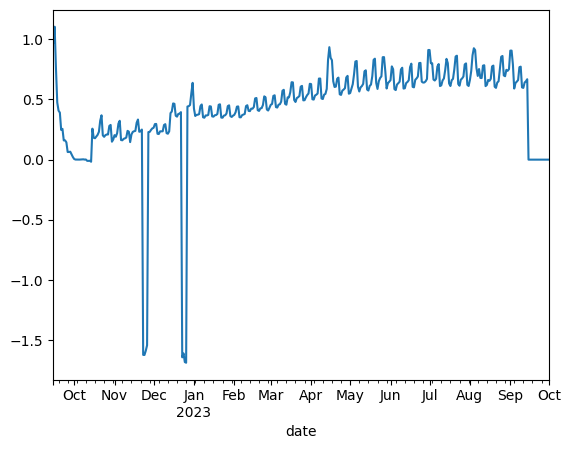

In [49]:
# But delta is minimal -  we will ignore this column
df1['delta'] = df1['price'] - df1['adjusted_price']
df1.groupby('date')['delta'].mean().plot(y='delta')

## Price seasonality during the year - By how much do prices spike?
- We see some kind of fluctuating pattern - is this price variation intra-week ?
- we also see price seasonality with higher prices during peak vacation period (Halloween in October?,Xmas, Easter, summer season)

<AxesSubplot:xlabel='date'>

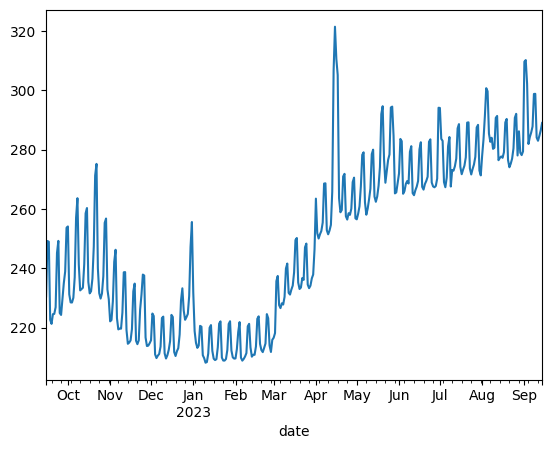

In [79]:
# adjust date to fit 1 year
bool_series = df1["date"].between('2022-09-15', '2023-09-14', inclusive = 'both')
df1[bool_series].groupby('date')['price'].mean().plot(y='price')

## Price per day of week
- Fridays and Saturdays the most expensive
- significant price drop for Sunday nights when reservations are usually ending
- less expensive the first half of the week vs the second half including week-ends when demand is higher

In [37]:
df1['day'] = df1.date.apply(lambda x: x.weekday())

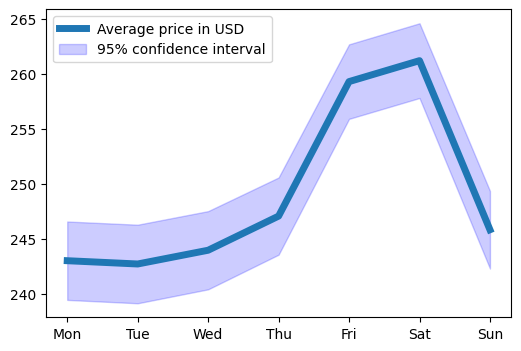

In [112]:
f, ax = plt.subplots(figsize=(6,4))
df1[bool_series].groupby('day')['price'].mean().plot(y='price', ax=ax, lw=5, label='Average price in USD')

# Define the confidence interval
ci = 2 * df1[bool_series].groupby('day')['price'].std() / df1[bool_series].groupby('day')['price'].mean()
plt.fill_between(x=['Mon','Tue','Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
                 y1=(df1[bool_series].groupby('day')['price'].mean()-ci),
                 y2=(df1[bool_series].groupby('day')['price'].mean()+ci),
                 color='blue', alpha=0.2, label='95% confidence interval')

# setting x-axis values
labels = ['Mon','Tue','Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.xticks(range(7),labels)
plt.xlabel(None)
plt.legend(loc='upper left')
plt.show()

## Analyze number of nights
- Minimum nights for a booking made on this day
- Maximum nights for a booking made on this day
- These data do not seem to bear any information with ceiling values set as standard parameters and will be discarded

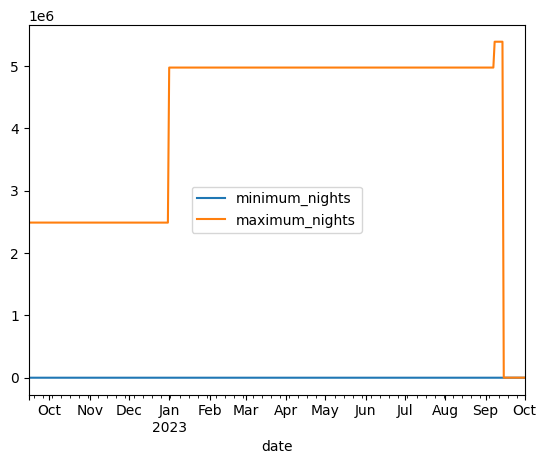

In [60]:
df1.groupby('date')['minimum_nights'].mean().plot(y='minimum_nights', label='minimum_nights')
df1.groupby('date')['maximum_nights'].mean().plot(y='maximum_nights', label='maximum_nights')
plt.legend(loc='center')
plt.show()

In [113]:
df1.groupby('date')['maximum_nights'].max()

date
2022-09-15    2147483647
2022-09-16    2147483647
2022-09-17    2147483647
2022-09-18    2147483647
2022-09-19    2147483647
                 ...    
2023-09-27          1125
2023-09-28          1125
2023-09-29          1125
2023-09-30          1125
2023-10-01          1125
Name: maximum_nights, Length: 382, dtype: int64

### Analyze availability

In [123]:
# Availability are noted as boolean True or False
df1.available.unique()

array(['f', 't'], dtype=object)

In [124]:
df1.available = df1.available.map({'t':True,'f':False})
df1[bool_series].available.value_counts()

True     985447
False    906331
Name: available, dtype: int64

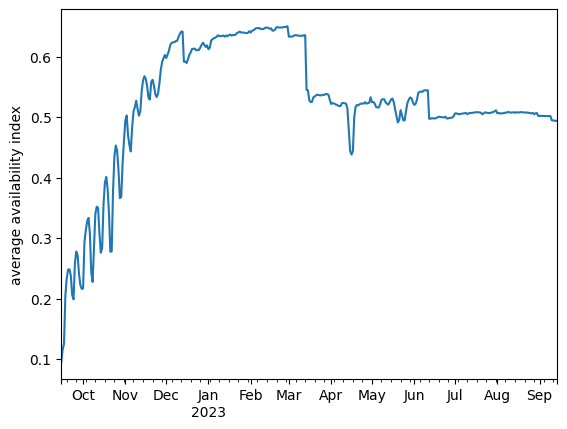

In [137]:
df1[bool_series].groupby('date').available.mean().plot()
plt.xlabel(None)
plt.ylabel('average availability index')
plt.show()

<AxesSubplot:xlabel='date'>

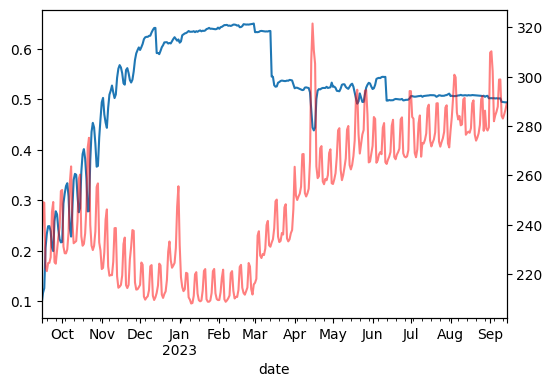

In [133]:
# We clearly see an opposite correlation between early reservations and price
f, ax = plt.subplots(figsize=(6,4))
ax1 = ax.twinx()
df1[bool_series].groupby('date').available.mean().plot(ax=ax)
df1[bool_series].groupby('date')['price'].mean().plot(y='price',ax=ax1, c='r', alpha=0.5)
plt.show()

# WRONG VIEW BECAUSE MIX RESERVATIONS FORWARD AND PAST OCCUPATION TILL SEPTEMBER

Text(0, 0.5, 'availability rate')

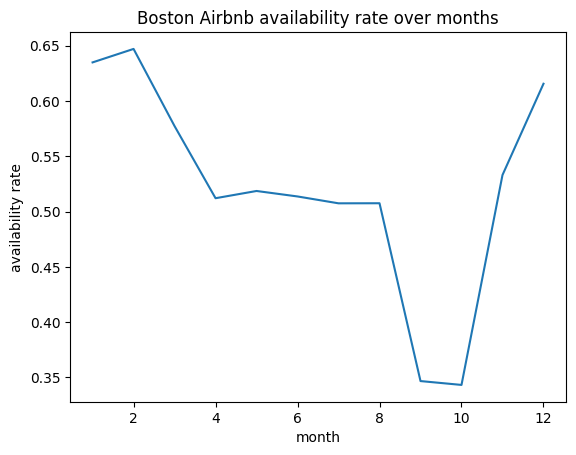

In [704]:
df1['month'] = pd.DatetimeIndex(df1['date']).month
ax1 = df1[bool_series].groupby('month')['available'].mean().plot(title='Boston Airbnb availability rate over months')
ax1.set_ylabel("availability rate")

## Listings

In [2089]:
keep_columns = ['id','host_since', 'name','description','neighborhood_overview','neighbourhood_cleansed',
                 'latitude','longitude','property_type',
                'room_type', 'accommodates','bathrooms_text','bedrooms','beds','amenities',
                'minimum_nights','maximum_nights', 'number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d',
                'reviews_per_month','first_review',
                'review_scores_rating',
                #'review_scores_accuracy',
                #'review_scores_cleanliness',
                #'review_scores_checkin',
                #'review_scores_communication',
                #'review_scores_location',
                #'review_scores_value',
                'price',]

filename = filenames[1]
filepath = os.path.join('Datasets',city,filename+'.csv')
df2 = pd.read_csv(filepath)
df2 = df2[keep_columns]

def clean_column(item):
    item = item.replace('$','')
    item = item.replace(',','')
    return float(item)

df2['price'] = df2['price'].apply(clean_column)
df2['host_since'] = pd.to_datetime(df2['host_since'])
df2['first_review'] = pd.to_datetime(df2['first_review'])
#df2['last_review'] = pd.to_datetime(df2['last_review'])
display(df2)

,id,host_since,name,description,neighborhood_overview,neighbourhood_cleansed,latitude,longitude,property_type,room_type,...,amenities,minimum_nights,maximum_nights,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,first_review,review_scores_rating,price
0,3168,2008-10-17,TudorStudio,"The ""Studio at 14 Weldon"" is located in Newton...","Newton has 13 unique villages, and gives off a...",Brighton,42.351480,-71.193190,Private room,Private room,...,"[""Dishes and silverware"", ""Long term stays all...",91,730,0,0,0,NaN,NaT,NaN,99.0
1,3781,2008-12-03,HARBORSIDE-Walk to subway,Fully separate apartment in a two apartment bu...,"Mostly quiet ( no loud music, no crowed sidewa...",East Boston,42.364130,-71.029910,Entire rental unit,Entire home/apt,...,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",32,1125,23,2,0,0.26,2015-07-10,4.96,132.0
2,5506,2009-02-19,** Fort Hill Inn Private! Minutes to center!**,"Private guest room with private bath, You do n...","Peaceful, Architecturally interesting, histori...",Roxbury,42.328440,-71.095810,Entire guest suite,Entire home/apt,...,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",3,90,113,5,0,0.69,2009-03-21,4.78,149.0
3,6695,2009-02-19,"Fort Hill Inn *Sunny* 1 bedroom, condo duplex","Comfortable, Fully Equipped private apartment...","Peaceful, Architecturally interesting, histori...",Roxbury,42.328020,-71.093870,Entire condo,Entire home/apt,...,"[""Dishes and silverware"", ""Long term stays all...",3,730,119,4,2,0.75,2009-08-06,4.80,179.0
4,7903,2009-04-20,"Colorful, modern 2 BR apt shared with host",I'm a high school teacher and frequent travele...,"The apartment is in Somerville, located direct...",Charlestown,42.390310,-71.093610,Private room in condo,Private room,...,"[""Bed linens"", ""Rice maker"", ""Dishes and silve...",4,100,295,17,2,1.84,2009-07-09,4.89,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,716081443145047239,2012-05-12,Private Room with Shared Bath in Quiet Street,*Please Note: You are booking a private room i...,South Boston is a very large neighborhood comp...,South Boston,42.331485,-71.051420,Private room in rental unit,Private room,...,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",2,1125,0,0,0,NaN,NaT,NaN,51.0
5181,716081469166085329,2012-05-12,Cozy Bedroom in Convenient Downtown Location,*Please Note: You are booking a private room i...,South Boston is a very large neighborhood comp...,South Boston,42.332679,-71.053346,Private room in rental unit,Private room,...,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",2,1125,0,0,0,NaN,NaT,NaN,51.0
5182,716081495310456299,2012-05-12,"Peaceful Bedroom w/ Shared Bath - AC, Wifi inc...",*Please Note: You are booking a private room i...,South Boston is a very large neighborhood comp...,South Boston,42.333266,-71.051323,Private room in rental unit,Private room,...,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",2,1125,0,0,0,NaN,NaT,NaN,51.0
5183,716235197792512391,2012-05-12,Sunny Room w/ Shared Bath in Modest Brighton Home,"Perfect for Hospital Stays, Medical Students, ...",The apartment is located in a walkable neighbo...,Brighton,42.353218,-71.162178,Private room in rental unit,Private room,...,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",2,1125,0,0,0,NaN,NaT,NaN,51.0


In [1955]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5185 entries, 0 to 5184
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      5185 non-null   int64         
 1   host_since              5185 non-null   datetime64[ns]
 2   name                    5185 non-null   object        
 3   description             5140 non-null   object        
 4   neighborhood_overview   3435 non-null   object        
 5   neighbourhood_cleansed  5185 non-null   object        
 6   latitude                5185 non-null   float64       
 7   longitude               5185 non-null   float64       
 8   property_type           5185 non-null   object        
 9   room_type               5185 non-null   object        
 10  accommodates            5185 non-null   int64         
 11  bathrooms_text          5178 non-null   object        
 12  bedrooms                4626 non-null   float64 

<AxesSubplot:>

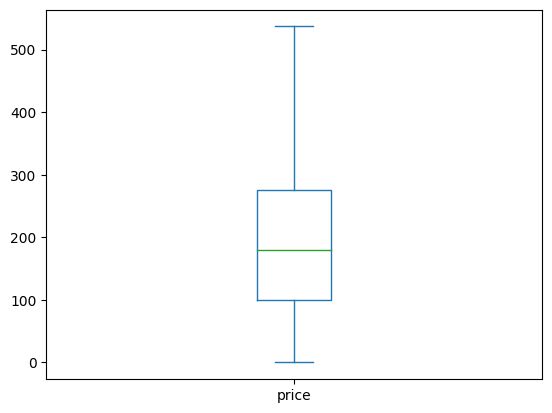

In [223]:
df2['price'].plot(kind='box',showfliers=False)

In [208]:
# Number of outliers
len(df2[df2.price>550])

250

In [206]:
fig = px.scatter_mapbox(df2[df2.price<550], lat='latitude', lon='longitude', hover_name="price",color = df2[df2.price<550]['price'],)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, width=800, height=800)
fig.update_layout(mapbox_bounds={"west": -71.85, "east": -70.3, "south": 42.21114, "north": 42.43114})
fig.show()

### Price per neighborhood

In [2090]:
df2['price_per_accommodation'] = df2['price']/df2['accommodates'] 
neighborhood_price_avg = df2.groupby(['neighbourhood_cleansed'])['price_per_accommodation'].mean()
#neighborhood_price_avg = df2.groupby(['neighbourhood_cleansed'])['price'].mean()
neighborhood_rating_avg = df2.groupby(['neighbourhood_cleansed'])['review_scores_rating'].mean()

In [1003]:
# source: https://www.kaggle.com/datasets/xujiang1993/boston-geojson?select=map.geojson
boston = json.load(open('./maps/map.geojson'))
fig = px.choropleth_mapbox(neighborhood_price_avg.reset_index(), 
                           geojson=boston, 
                           featureidkey='properties.name', 
                           locations='neighbourhood_cleansed', 
                           color='price_per_accommodation',
                           center={"lat": 42.3201, "lon": -71.0589},
                           mapbox_style="carto-positron",
                           width=1000, height=600,
                           zoom=10
                          )
fig.show()

### rating par neighborhood

In [1004]:
fig = px.choropleth_mapbox(neighborhood_rating_avg.reset_index(), 
                           geojson=boston, 
                           featureidkey='properties.name', 
                           locations='neighbourhood_cleansed', 
                           color='review_scores_rating',
                           center={"lat": 42.3201, "lon": -71.0589},
                           mapbox_style="carto-positron",
                           width=1000, height=600,
                           zoom=10
                          )
fig.show()

In [229]:
df2.neighbourhood_cleansed.unique()

array(['Brighton', 'East Boston', 'Roxbury', 'Charlestown', 'Allston',
       'Beacon Hill', 'Back Bay', 'North End', 'Dorchester', 'Fenway',
       'Jamaica Plain', 'Downtown', 'South Boston', 'Mission Hill',
       'Bay Village', 'West Roxbury', 'Roslindale', 'South End',
       'Longwood Medical Area', 'West End', 'Hyde Park', 'Mattapan',
       'Harbor Islands', 'Chinatown', 'South Boston Waterfront',
       'Leather District'], dtype=object)

In [219]:
df2.neighborhood_overview.unique()

array(['Newton has 13 unique villages, and gives off a very New England feel. We live just a few minutes from both Newtonville and Newton Centre in a quiet,safe neighborhood!',
       'Mostly quiet ( no loud music, no crowed sidewalks)  area with residential 3 story buildings, some 4 and 5 story newer buildings. Though not in an "entertainment" area there are local food shops and supermarket with a mix of restaurants.  Area is in transition--East Boston has a great waterfront with gentrification evident everywhere!',
       'Peaceful, Architecturally interesting, historic, diverse, and quiet residential. <br /><br />Culturally,  ethnically, and economically diverse.',
       ...,
       "The house is almost 150 years old and was designed by one of the most famous  Boston architects of that era.  The neighborhood used to be a summer place for Boston Brahmins in the 1800s.  It's wide, quiet (yet Harvard Sq is mere 15 mins. away), idyllic with trees on both sides of the street. Children p

In [231]:
df2.groupby('neighbourhood_cleansed').price.mean().sort_values()

neighbourhood_cleansed
Hyde Park                  119.569231
Roxbury                    136.773649
Roslindale                 148.492063
Mattapan                   172.500000
Dorchester                 173.080963
East Boston                176.469208
Leather District           184.600000
Brighton                   190.441805
Allston                    196.001325
Mission Hill               199.795699
Charlestown                205.090909
Jamaica Plain              213.720000
Longwood Medical Area      222.393443
Bay Village                228.903846
South Boston               233.605442
Beacon Hill                236.732919
South End                  265.961240
West End                   275.396552
Fenway                     276.922131
Harbor Islands             279.166667
North End                  313.494505
South Boston Waterfront    324.434783
Downtown                   333.022599
Back Bay                   364.640288
Chinatown                  392.898876
West Roxbury               

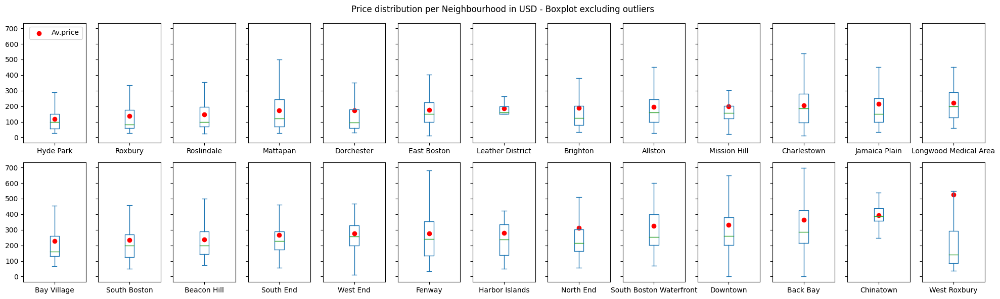

In [335]:
sorted_neighbourhoods = df2.groupby('neighbourhood_cleansed').price.mean().sort_values().index.tolist()
n_neighbourhoods = len(sorted_neighbourhoods)
n_cols = int(np.ceil(n_neighbourhoods/2))
f, ax = plt.subplots(nrows=2, ncols=n_cols, sharey=True, figsize=(20,6), squeeze=True)
[df2.groupby('neighbourhood_cleansed').get_group(sorted_neighbourhoods[i]).price.plot(kind='box', showfliers=False, label=sorted_neighbourhoods[i], ax= ax[i//n_cols,i%n_cols]) for i in range(n_neighbourhoods)]
[ax[i//n_cols,i%n_cols].scatter(x=[1] , y=df2.groupby('neighbourhood_cleansed').get_group(sorted_neighbourhoods[i]).price.mean(), c='r', label='Av.price' if i==0 else '') for i in range(n_neighbourhoods)]
f.suptitle('Price distribution per Neighbourhood in USD - Boxplot excluding outliers')
ax[0,0].legend()
plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.show()

<AxesSubplot:ylabel='Frequency'>

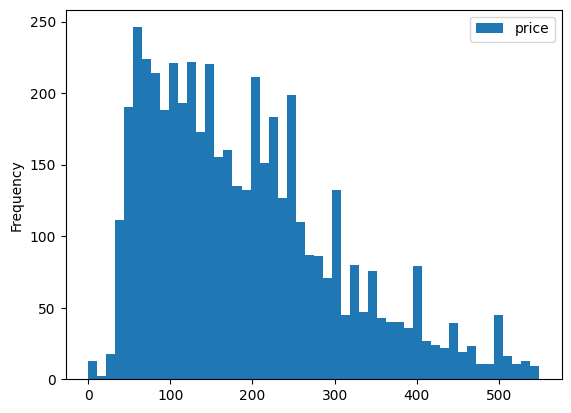

In [2082]:
df2[df2.price<550].plot(y='price', kind='hist', bins=50)

<AxesSubplot:ylabel='Frequency'>

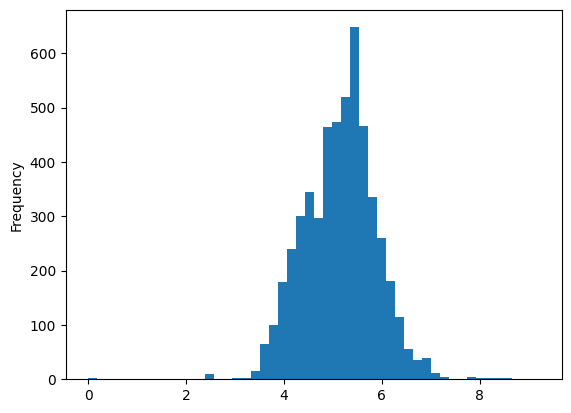

In [2085]:
np.log(df2['price']+1).plot(kind='hist', bins=50)

<AxesSubplot:xlabel='review_scores_rating', ylabel='price'>

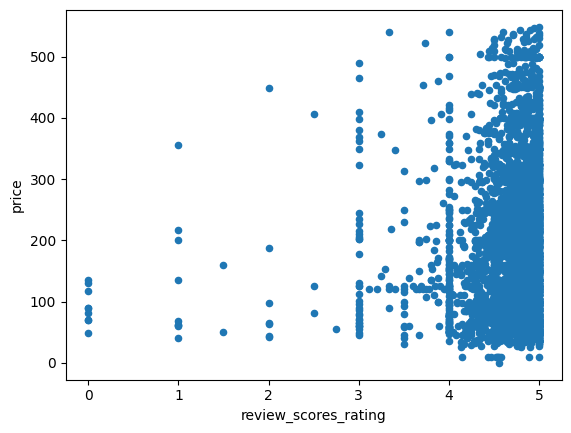

In [214]:
# No correlation bw price and average rating
df2[df2.price<550].plot(x='review_scores_rating', y='price', kind='scatter')

<AxesSubplot:xlabel='review_scores_rating', ylabel='number_of_reviews'>

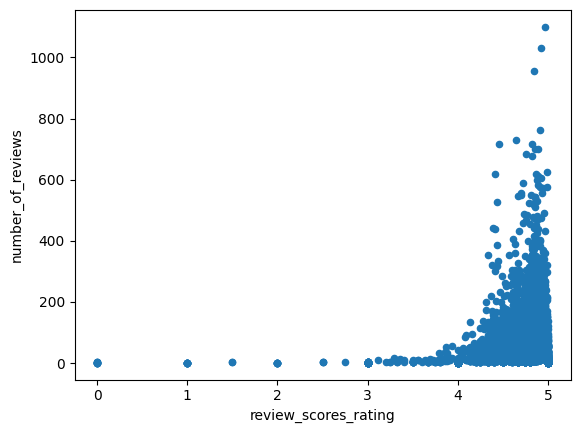

In [217]:
# No correlation bw price and average rating
df2[df2.price<550].plot(x='review_scores_rating', y='number_of_reviews', kind='scatter')

<AxesSubplot:>

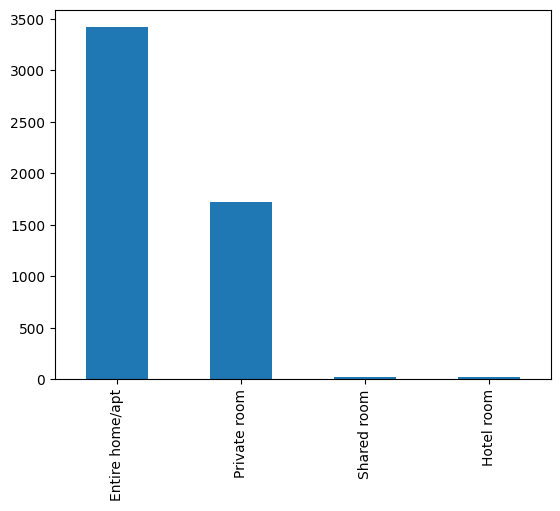

In [339]:
df2.room_type.value_counts().plot(kind='bar')

<AxesSubplot:>

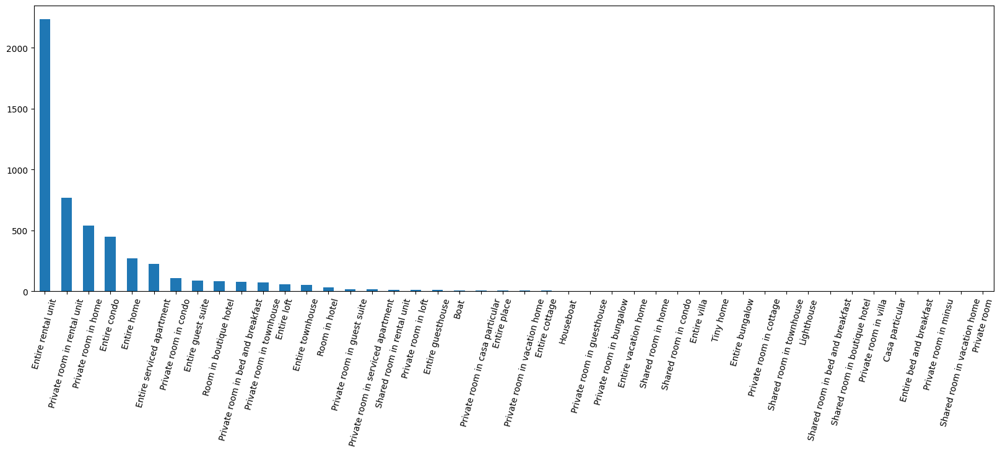

In [350]:
df2.property_type.value_counts().plot(kind='bar', figsize=(20,6), rot=75)

## Short-Term Rentals

In [2091]:
df2['min_nights_tr'] = df2.minimum_nights.copy()
df2['min_nights_tr'] = df2['min_nights_tr'].apply(lambda x: x if x<=35 else 35)

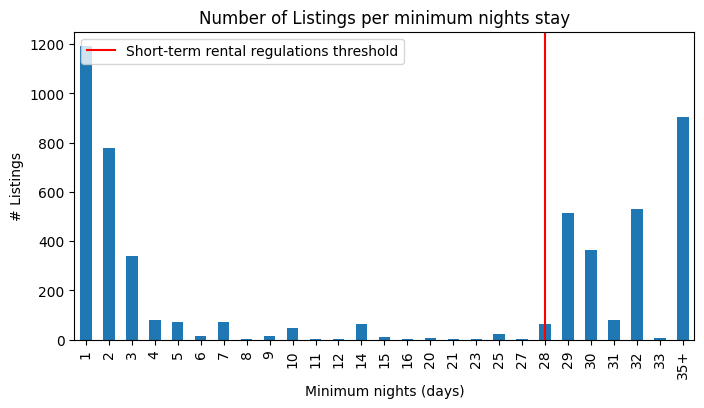

In [441]:
f, ax = plt.subplots(figsize=(8,4))
df2.min_nights_tr.value_counts(sort=False).sort_index().plot(kind='bar', label='')
labels = [item.get_text() for item in ax.get_xticklabels()]
labels[-1] += '+'
ax.set_xticklabels(labels)
threshold = labels.index('28')
plt.axvline(x=threshold, c='r', label='Short-term rental regulations threshold' )
plt.title('Number of Listings per minimum nights stay')
plt.xlabel('Minimum nights (days)')
plt.ylabel('# Listings')
plt.legend(loc='upper left')
plt.show()

# Reviews

In [462]:
filename = filenames[2]
filepath = os.path.join('Datasets',city,filename+'.csv')
df3 = pd.read_csv(filepath)
df3['date'] = pd.to_datetime(df3['date'])
display(df3)
print(df3.info())
print(df3.describe())

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,3781,37776825,2015-07-10,36059247,Greg,The apartment was as advertised and Frank was ...
1,3781,41842494,2015-08-09,10459388,Tai,It was a pleasure to stay at Frank's place. Th...
2,3781,45282151,2015-09-01,12264652,Damien,The apartment description is entirely faithful...
3,3781,49022647,2015-09-30,41426327,Mike,Thoroughly enjoyed my time at Frank's home. Ha...
4,3781,52503327,2015-10-30,15151513,Ivan,Great value for the money! This location has e...
...,...,...,...,...,...,...
245312,710219921415947886,715207168324572368,2022-09-13,359101867,Kyle,The stay was great place was the cleanest hous...
245313,710811277169357121,713701494730849012,2022-09-11,255432906,Inkar,Perfect place to stay.
245314,710822541189911014,713771849694419478,2022-09-11,292854595,Melissa,Literally amazing! I will definitely stay agai...
245315,710826357260492300,713771362187832096,2022-09-11,376242703,Karina,It was beautiful and very peaceful


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245317 entries, 0 to 245316
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   listing_id     245317 non-null  int64         
 1   id             245317 non-null  int64         
 2   date           245317 non-null  datetime64[ns]
 3   reviewer_id    245317 non-null  int64         
 4   reviewer_name  245316 non-null  object        
 5   comments       245267 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 11.2+ MB
None
         listing_id            id   reviewer_id
count  2.453170e+05  2.453170e+05  2.453170e+05
mean   1.198847e+16  1.900838e+17  1.278702e+08
std    8.409927e+16  2.741409e+17  1.219530e+08
min    3.781000e+03  1.021000e+03  3.000000e+00
25%    7.330494e+06  2.643189e+08  2.977775e+07
50%    1.829056e+07  5.389864e+08  8.658868e+07
75%    3.307284e+07  4.775088e+17  1.916022e+08
max    7.108379

<AxesSubplot:ylabel='Frequency'>

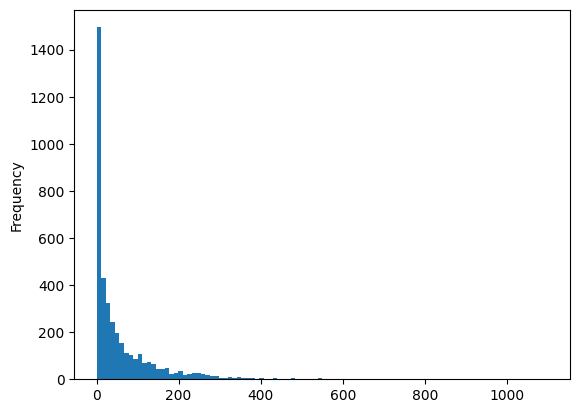

In [461]:
df3.groupby('listing_id').comments.count().plot(kind='hist',bins=100)
plt.show()

## What are the busiest times of the year to visit Boston?
- We will approximate using the number of reviews as a proxy for the number of visitors

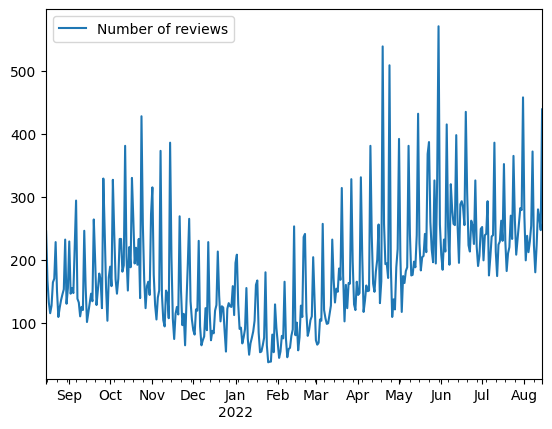

In [708]:
# Let's look a a full year excluding COVID lockdowns
bool_series = df3["date"].between('2021-8-15', '2022-8-14', inclusive = 'both')
df3[bool_series].groupby('date').count().plot(y='comments',kind='line', label='Number of reviews')
plt.xlabel(None)
plt.show()

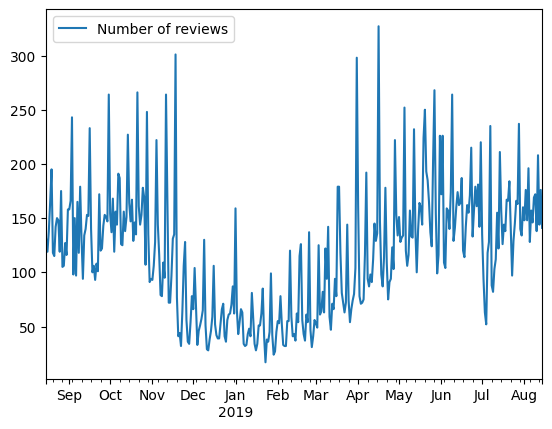

In [709]:
# We can compare to the tourists activity profile pre-COVID
bool_series = df3["date"].between('2018-8-15', '2019-8-14', inclusive = 'both')
df3[bool_series].groupby('date').count().plot(y='comments',kind='line', label='Number of reviews')
plt.xlabel(None)
plt.show()

the seasonality of both periods look quite similar but the frequency of the comments seem higher nowdays

In [492]:
# H0: the 2 series come from same distribution
bool_series = df3["date"].between('2021-8-15', '2022-8-14', inclusive = 'both')
a = df3[bool_series].groupby('date').count()['comments']
bool_series = df3["date"].between('2018-8-15', '2019-8-14', inclusive = 'both')
b = df3[bool_series].groupby('date').count()['comments']
print('Serie a: mean=', round(a.mean(),1), 'std dev=', round(a.std(),1))
print('Serie b: mean=', round(b.mean(),1), 'std dev=',round(b.std(),1))
print("the two series seems very different. let's confirm with a student test")

Serie a: mean= 183.1 std dev= 90.3
Serie b: mean= 117.0 std dev= 57.8
the two series seems very different. let's confirm with a student test


In [488]:
from scipy.stats import ttest_ind
#print('t statistic =',ttest_ind(a,b).statistic)
t_score = ttest_ind(a,b).pvalue
print('p-value =',t_score)
# two-tailed test
alpha = 0.01 / 2

if t_score < alpha:
    print("Two-tailed test: p-value is below alpha / 2 =", alpha)
    print("H0 rejected - the two series are statistically different with a 99% confidence level")
else:
    print("p-value is above alpha")
    print("We cannot reject H0 - cannot assume the two series are statistically different")

p-value = 2.1935648763260313e-29
Two-tailed test: p-value is below alpha / 2 = 0.005
H0 rejected - the two series are statistically different with a 99% confidence level


### Conclusion Busiest periods
- considering the number of reviews as a proxy, the busiest periods are 
    - October
    - April 
    - summer from June till end of August, or even extending till end of November as shown in 2018-2019 data

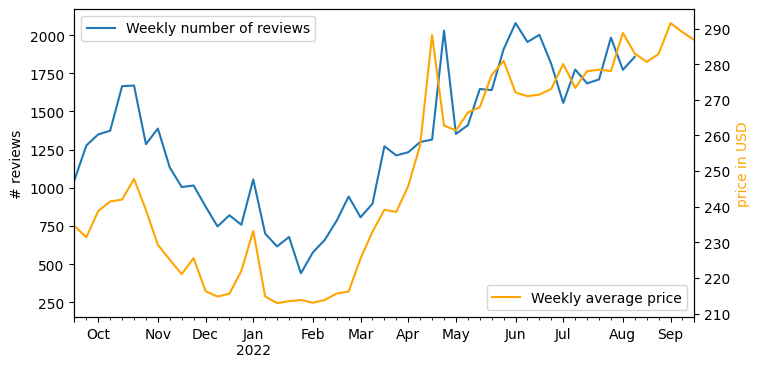

In [969]:
# Let's look a a full year excluding COVID lockdowns
f, ax = plt.subplots(figsize=(8,4))

# Plot number of comments per week
bool_series = df3["date"].between('2021-8-15', '2022-8-14', inclusive = 'both')
df3[bool_series].groupby(pd.Grouper(key='date', axis=0, freq='W')).count().plot(y='comments', kind='line', label='Weekly number of reviews', ax=ax)
ax.set_xlabel(None) 
ax.set_ylabel('# reviews') 

# create secondary y axis for the second graph
ax1 = ax.twinx()
ax1.set_ylabel('price in USD', color = 'orange')
ax1.set_xlabel(None)
# Select prices over a year using calendar reservation file
bool_series = df1["date"].between('2022-9-15', '2023-9-14', inclusive = 'both')
serie_prices = df1[bool_series]['price']
# shift whole timeline index by one year to align with timeline of the comments above
serie_dates = df1[bool_series].date - timedelta(days=365)
# assemble price series along shifted timeline to get synthetic dataset of price development
prices_df = pd.DataFrame({'date': serie_dates, 'price':serie_prices})
prices_df.groupby(pd.Grouper(key='date', axis=0, freq='W')).mean().plot(y='price',kind='line', label='Weekly average price', ax=ax1, c='orange')

# Add legends
ax1.legend(loc='lower right')
plt.show()

# Is there a general upward trend of both new Airbnb listings and total Airbnb visitors to Boston?
- To answer this question we would need to look at the number of unique listings and its development overtime
- let's observe the number of listings offered since 2017 using 'host_since' variable
- we assume 'host_since' reflects the date when hosts registered as a Airbnb guest and therefore growing the the listings of properties

In [807]:
bool_filter = df2.host_since.between('2016-12-31', '2022-8-1', inclusive = 'neither')
hosts_count = df2[bool_filter].groupby('host_since').count()[['id']]
hosts_count['Cumulated_listings'] = np.cumsum(hosts_count['id'])
#hosts_count['listings_index'] = (hosts_count['Cumulated_listings'] / hosts_count.iloc[0,1] *100).round(0)
hosts_count

,id,Cumulated_listings
host_since,,
2017-01-06,5,5
2017-01-07,1,6
2017-01-13,1,7
2017-01-16,1,8
2017-01-21,1,9
...,...,...
2022-07-02,1,1897
2022-07-09,1,1898
2022-07-11,1,1899


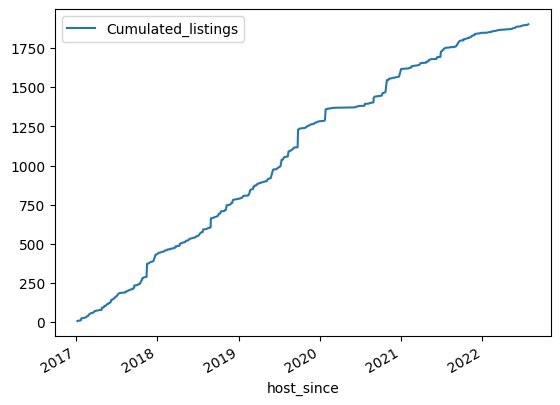

In [808]:
hosts_count.plot(y='Cumulated_listings')
plt.show()

- If we assume that the number of reviews is a proxy of the number of visitors, Looking at the historical development of the number of reviews, We clearly see a growing trend overtime, a drop during COVID lockdowns (2020) and a catch-up accelerating starting in H2 2021

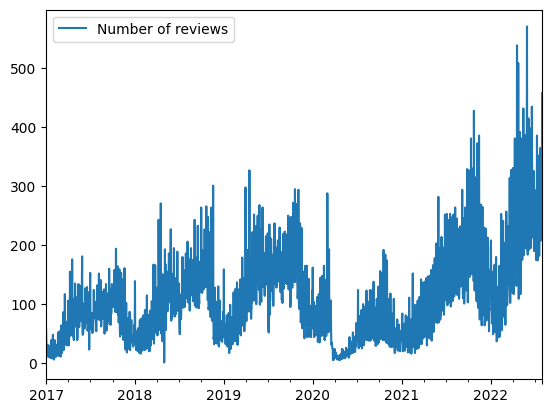

In [809]:
bool_filter = df3["date"].between('2016-12-31', '2022-8-1', inclusive = 'neither')
df3[bool_filter].groupby('date').count().plot(y='comments',kind='line', label='Number of reviews')
plt.xlabel(None)
plt.show()

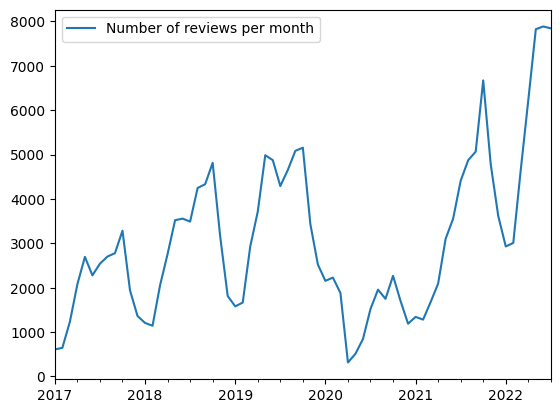

In [810]:
df3[bool_filter].groupby(pd.Grouper(key='date', axis=0, freq='M')).count().plot(y='comments',kind='line', label='Number of reviews per month')
plt.xlabel(None)
plt.show()

- let's combine both metrics
- we clearly see a growing trend for both metrics despite the drop in 2020 due to COVID
- follwoing a sharp rebound during 2021, visitors frequentation may be stabilizing in 2022

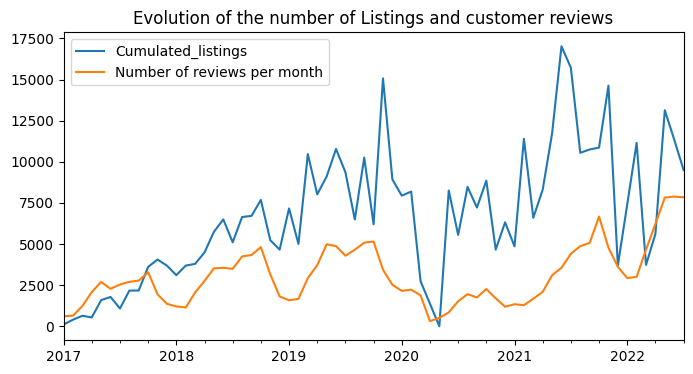

In [815]:
f, ax = plt.subplots(figsize=(8,4))
#ax1 = ax.twinx()
#hosts_count.plot(y='Cumulated_listings', ax=ax)
hosts_count.reset_index().groupby(pd.Grouper(key='host_since', axis=0, freq='M')).sum().plot(y='Cumulated_listings', ax=ax)
df3[bool_filter].groupby(pd.Grouper(key='date', axis=0, freq='M')).count().plot(y='comments',kind='line', label='Number of reviews per month', ax=ax)
plt.xlabel(None)
plt.title('Evolution of the number of Listings and customer reviews')
plt.show()

# Vibes of neighborhoods
- Can you describe the vibe of each Boston neighborhood using listing descriptions?

- we will apporach this problem by looking at the short description provided by the hosts on the neighborhood
- we will look at most frequent words after removing stopwords
- we expect those frequent words will provide a description of what each neighborhood offers

In [1060]:
# !pip install git+https://github.com/boudinfl/pke.git
import pke

In [1232]:
neighborhood_description = {}
temp = df2.dropna(subset='neighborhood_overview')
# group by neighborhood
for nbhood, temp_df in temp.groupby('neighbourhood_cleansed'):
    # document is expected to be a simple text string
    text = temp_df.neighborhood_overview.to_list()
    sampletext = """. """.join(text)
    neighborhood_description[nbhood] = sampletext

In [1199]:
len(neighborhood_description), neighborhood_description.keys()

(26,
 dict_keys(['Allston', 'Back Bay', 'Bay Village', 'Beacon Hill', 'Brighton', 'Charlestown', 'Chinatown', 'Dorchester', 'Downtown', 'East Boston', 'Fenway', 'Harbor Islands', 'Hyde Park', 'Jamaica Plain', 'Leather District', 'Longwood Medical Area', 'Mattapan', 'Mission Hill', 'North End', 'Roslindale', 'Roxbury', 'South Boston', 'South Boston Waterfront', 'South End', 'West End', 'West Roxbury']))

In [1342]:
import html
import re
import string
punct = set(string.punctuation)
import nltk
from nltk.corpus import stopwords
nltk.download("stopwords")
stop_words = set(stopwords.words("english"))
stop_words = stop_words.union(['boston', 'neighborhood', 'minute', 'minutes', 'min', 'mins', 'mile', 'miles', 'walk'])
for nbhood in neighborhood_description.keys():
    stop_words = stop_words.union(nbhood.lower().split())

def preprocess_text(text, stop_words):
    
    #Escaping out HTML characters
    clean_text = html.unescape(text)
    
    # remove hyperlinks
    clean_text = re.sub(r'https?:\/\/.\S+', "", clean_text)

    # remove hashtags
    # only removing the hash # sign from the word
    clean_text = re.sub(r'#', '', clean_text)

    # remove old style retweet text "RT"
    clean_text = re.sub(r'^RT[\s]+', '', clean_text)
    
    # removing mentions
    clean_text = re.sub("@\S+", "", clean_text)
    
    # removing digits
    clean_text = re.sub(r'[0-9]+', '', clean_text)
    
    #Encode from UTF-8 to ascii
    encode_text = clean_text.encode('ascii','ignore')
    #decode from ascii to UTF-8
    clean_text=encode_text.decode(encoding='UTF-8')
    
    # removing stopwords
    clean_text = " ".join([word for word in clean_text.split() if word not in stop_words])

    # lowercasing the text
    clean_text = clean_text.lower()
    
    # remove old html tags
    clean_text = clean_text.replace("<br>", " ")
    clean_text = clean_text.replace("<br />", " ")
    clean_text = clean_text.replace(" />", " ")
    clean_text = re.sub('\n', '', clean_text)
    
    # remove punctuation
    clean_text = "".join([ch for ch in clean_text if ch not in punct])
    
    # eliminate multiple whitespaces
    clean_text = clean_text.strip()
    clean_text = re.sub(' +', ' ', clean_text)
    
    return clean_text


for key in neighborhood_description.keys():
    # clean text for each neighborhood
    neighborhood_description[key] = preprocess_text(neighborhood_description[key], stop_words)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lveys\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [1343]:
def extract_key_phrases(text, pke_extractor='positionrank', pos={'VERB','NOUN', 'PROPN','ADJ'}, topk=5):
    
    if pke_extractor=='textrank':
        # define the set of valid Part-of-Speeches
        #pos = {'VERB','NOUN', 'PROPN','ADJ'} # 'VERB','NOUN', 'PROPN', 

        # 1. create a TextRank extractor.
        extractor = pke.unsupervised.TextRank()

        # 2. load the content of the document.
        extractor.load_document(input=nlp(text),
                                language='en',
                                normalization='lemmas')

        # 3. build the graph representation of the document and rank the words.
        #    Keyphrase candidates are composed from the 33-percent highest-ranked words.
        extractor.candidate_weighting(window=2,
                                      pos=pos,
                                      top_percent=0.74)
    
    else:
        if pke_extractor!='positionrank':
            print('unreckonized extractor - will use default positionrank extractor')
        
        # 1. initialize keyphrase extraction model
        extractor = pke.unsupervised.PositionRank()

        # 2. load text
        extractor.load_document(input=nlp(text), language='en',
                                normalization='stemming')

        # 3. keyphrase candidate selection
        extractor.candidate_selection()

        # 3. candidate weighting
        extractor.candidate_weighting()       
        
        
    # 4. get the k-highest scored candidates as keyphrases
    keyphrases = extractor.get_n_best(n=topk, redundancy_removal=True, stemming=False)

    return keyphrases

In [1344]:
import spacy
# !python -m spacy download en_core_web_sm
nlp = spacy.load("en_core_web_sm")
spacy.prefer_gpu()

False

In [1345]:
def word_cloud(nbhood, keyphrase_lst, adjectives_lst): #topk
    
    keywords = [] ; adjectives = []
    for keyphrase in keyphrase_lst:
        keywords.extend(keyphrase.split())
        
    for sent in adjectives_lst:
        adjectives.extend(sent.split())
    
    f, ax = plt.subplots(1,2, figsize = (10,8))
    
    print(f'\nWordcloud for neighborhood {nbhood} \n')
    for i, item_lst in enumerate([keywords, adjectives]):
        cloud = WordCloud(stopwords = stop_words, 
                            background_color = 'white',
                            width=2500, height=1800
                         ).generate(" ".join(item_lst))
    
        ax[i].imshow(cloud)
        ax[i].axis('off')
    plt.show()

************** Allston **************


street porter square shopping center porter square mbta subway station commuter rail lesley university harvard law school davis square subway ride harvard collegeharvard square subway ride mit mgh subway ride harvard public library
close drive harvard university drive public transport northeastern university harvard square porter square cambridge porter square subway commuter rail station harvard law school half lesley college
foods market prospect st cambridge oleana restaurant hampshire st cambridge bondir restaurant broadway cambridge hampshire market hampshire st cambridge coast grill raw bar cambridge st cambridge
porter square station close cambridge offer harvard law school harvard university lesley university grocery stores coffee shops restaurants
lots shops restaurants night life inman square harvard square union square harvard art museums public library pool



Wordcloud for neighborhood Allston 



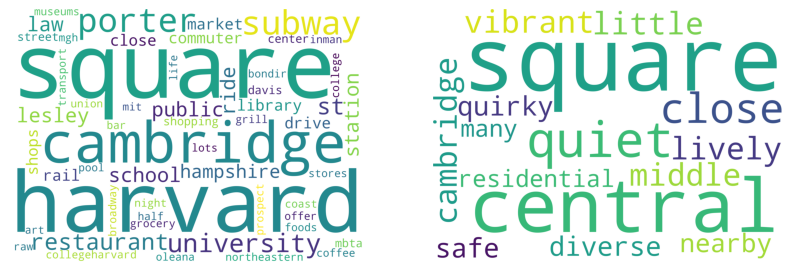


************** Back Bay **************


location location location newbury st hynes convention center prudential center fashionable newbury street shops restaurants boylston street shops restaurants northeastern university charles river esplanade
newbury street location baysouth steps copley square prudential center newbury street boylston street
shopping streets newbury street boylston street charles street cambridge street
heart city newbury street long stretch thcentury brownstones homes hundreds shops restaurants newbury street
hynes convention center shops prudential center copley place mall boutiques newbury boylston street



Wordcloud for neighborhood Back Bay 



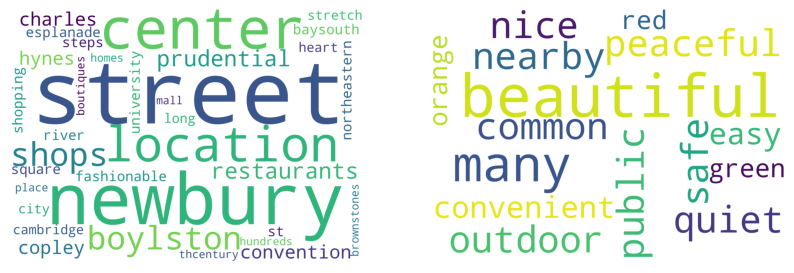


************** Bay Village **************


restaurants cafes shopping entertainment picturesque brownstone streets studio
colleges emerson berkeley bu college umass mass college pharmacy
destinations freedom trail museum fine arts faneuil hall marketplace
cafes bars restaurants theaters parks commons bostons
opera house comedy music acts perform wilbur lowkey



Wordcloud for neighborhood Bay Village 



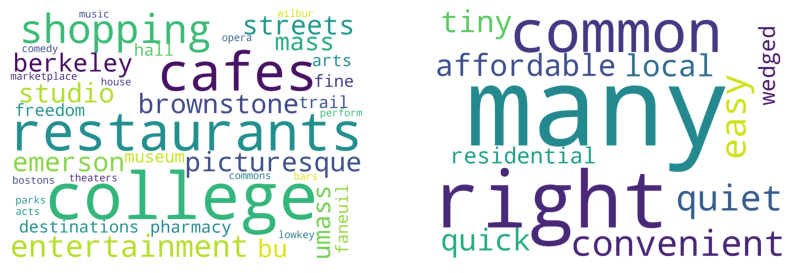


************** Beacon Hill **************


restaurants shops cafes next street charles street close picturesque
subway ride childrens museum institute contemporary art museum fine arts street mass general hospital government centre state house
streets gas lamps home massachusetts state house charles street neighborhoo historic
fine food wine shops charles street evening gaslit streets
neighborhoods bostons subway mass general hospital mass eye ear charles street steps



Wordcloud for neighborhood Beacon Hill 



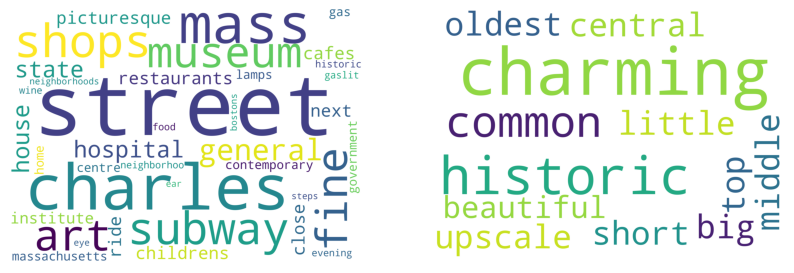


************** Brighton **************


steps restaurants shops public transportation mbta green line c b trains easy commute hospitals college university st elizabeths bostons tourist attractions street
town diner breakfast needs walking distance town square restaurants coffee shops public transportation express bus college public transportation
close shaws market bakery restaurants laundrymat rod dee thai food kosher food liquor store synagogues green line street publik house emac bolios fireplace e room
luxury house chestnut walking distance shopping centerstar mkt cvs restaurants theater wegmans station bc step country club museum washington square
town centers coolidge corner brookline washington square subway cambridge ride green line mbta bus route brookline



Wordcloud for neighborhood Brighton 



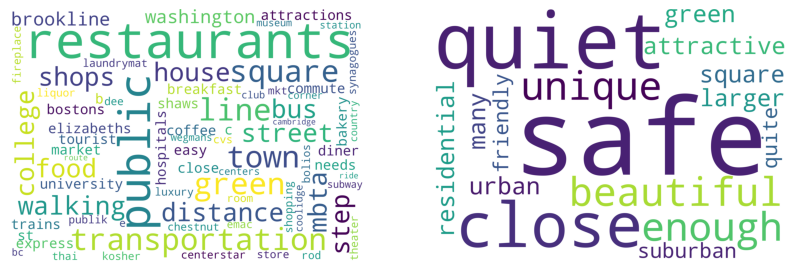


************** Charlestown **************


attractions assembly square mall assembly row mall cambridgeside mall harvard square harvard university tufts university davis square charles river memorial dr side museum science td garden walking distance restaurants bars supermarkets malls museum gas station laundromat
foods market prospect st cambridge oleana restaurant hampshire st cambridge bondir restaurant broadway cambridge hampshire market hampshire st cambridge coast grill raw bar cambridge st cambridge
close central square inman square cambridge crossing union square somerville lot amazing restaurants cafes breweries
easy walking distance kendall square central square inman square harvard square union square
cambridge logan airport faneuil hall market place ne aquarium gardens science museum childrens museum encore gateway center mall assembly row shopsdiningand amc theater



Wordcloud for neighborhood Charlestown 



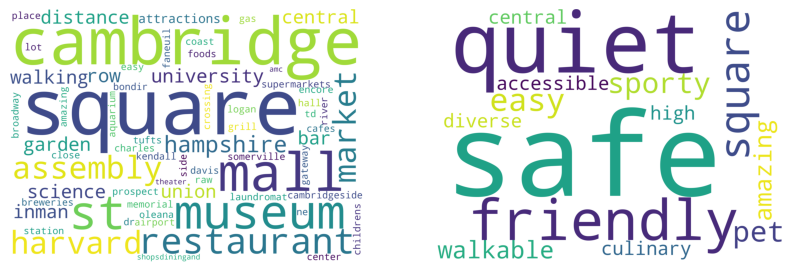


************** Chinatown **************


entertainment dining venues city right intersection theatre bostons financial
entertainment dining venues city right intersection theatre walking
garden seaport little italy quincy market bars
transportation catch red green blue orange lines
center city hall



Wordcloud for neighborhood Chinatown 



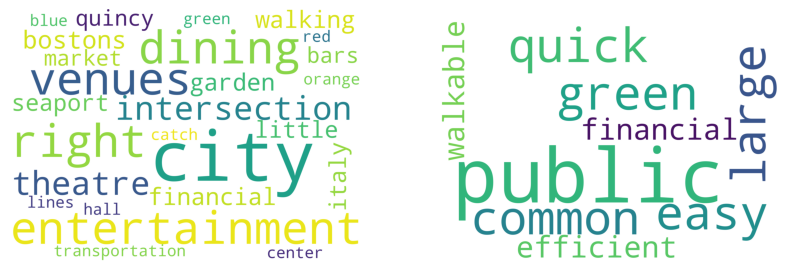


************** Dorchester **************


art christopher columbus clifford playground carson beach castle island savin malibu beach wollaston beach marina brothers supermarket dudley street cvs dudley street star market amc center ave center shopping mallmiles franklin zoo horatio harris charles river esplanade institute
art christopher columbus clifford playground carson beach castle island savin malibu beach wollaston beach marina brothers supermarket dudley street cvs dudley street star market amc center ave center shopping mallmiles proximity destinations interest airport
history things joseph finnegan pope john paul john f kennedy presidential library museum franklin zoo edward kennedy institute us senate commonwealth museum strand theater bowl tenean beach stop drink bite molinaris brick
walking savin fields corner subway stations savin home savin beach local
experience walking distance redline subway station bus stop drive highway us rt convenientclose bars restaurants cafes parks city bostons



Wordcloud for neighborhood Dorchester 



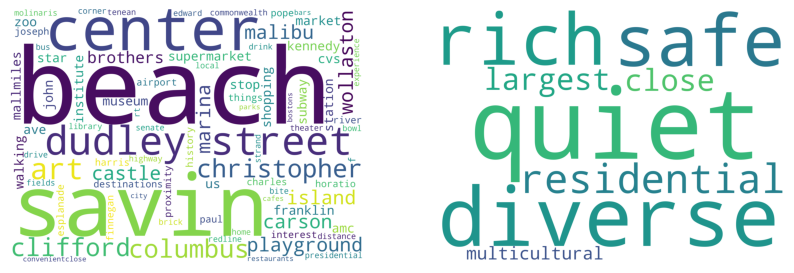


************** Downtown **************


walking distance colonial theatre emerson college emerson majestic theatre maceys opera house primark schubert theatre subway green line suffolk university winter st steps common
house great restaurants hanover street proximity faneuil hall government center
transportation shopping banking restaurants financial government center theater crossing center
frog pond head common see golden dome state house travel government center quincy market faneuil hall
buildings house mix department stores fashion discount chains souvenir shops specialty retailers street vendors



Wordcloud for neighborhood Downtown 



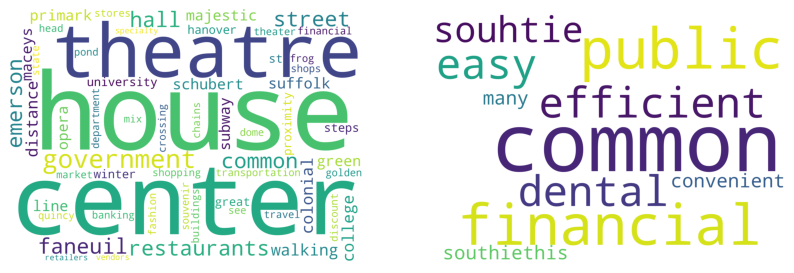


************** East Boston **************


mgh mi drive mgh chelsea mi drive brigham womens mi drive childrens mi drive tufts center mi drive shriners childrens hospital mi drive partners healthcare assembly mi drive
mgh drive mgh chelsea drive brigham womens drive childrens drive tufts center drive shriners childrens hospital drive partners healthcare assembly drive chelsea
mgh drive mgh chelsea drive brigham womens drive childrens drive tufts center drive shriners childrens hospital drive partners healthcare assembly drive apartment
mgh drive mgh chelsea drive brigham womens drive childrens drive tufts center drive shriners childrens hospital drive partners healthcare assembly drive eagle
explore td garden paul revere house common new england aquarium faneuil hall marketplace museum science tea party ships museum public garden museum fine arts sun sand winthrop shore reservation donovan beach



Wordcloud for neighborhood East Boston 



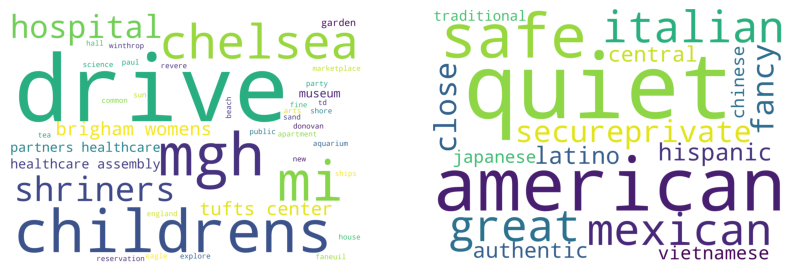


************** Fenway **************


foods market river st cambridge dimitrios cuisine brookline st cambridge coast cafe river st cambridge cuchi cuchi main st cambridge
brookline st cambridge trader joes memorial dr cambridge andala coffee house franklin st cambridge
edge attractions newbury street museum fine arts isabella stewart gardner museum faneuil hall marketplace new england aquarium institute contemporary art franklin zoo parks
distance harvard mit central kendall square bu red green lines charles river cambridgeport part cambridge
views charles river college town home harvard university mit cambridge



Wordcloud for neighborhood Fenway 



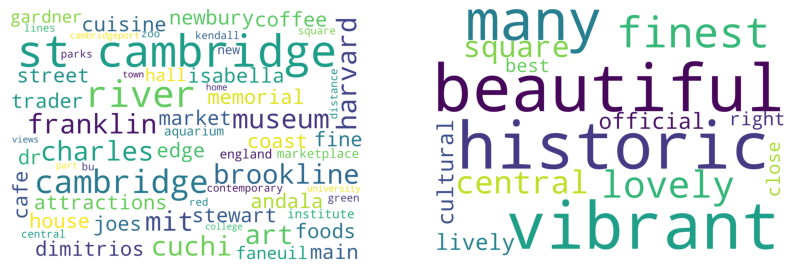


************** Harbor Islands **************
house close airport bus stop beach view
restaurants cafe ice cream libations convenience store
shipping channel eastern flightpath airport close
boats day georges island hingham
airport docks fish stoney

Wordcloud for neighborhood Harbor Islands 



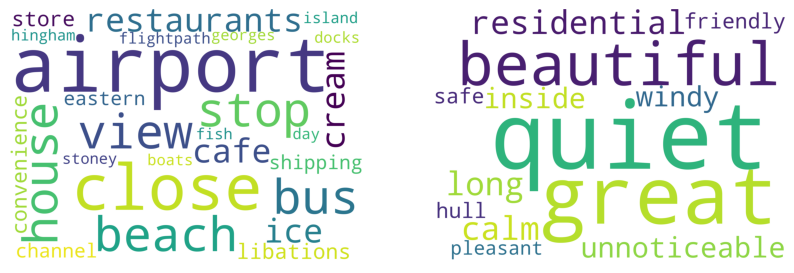


************** Hyde Park **************
gillette stadium td garden franklin zoogolf gas grocery wine liquor stores apartment
bostons theater pond harvard universitys arnold arboretum legacy place
milton academy milton high school school amenities sports
shops restaurants stony brook reservation stony brook francis
grocery shopping fullservice salons specialty shopping milton



Wordcloud for neighborhood Hyde Park 



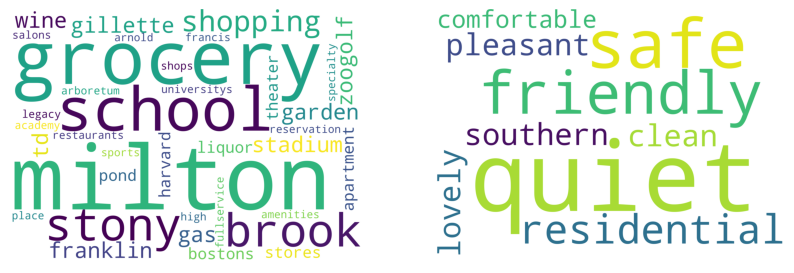


************** Jamaica Plain **************


center new england baptist hospital grocery stores wholefood stopshop cvs transportation stony brook subway station busses cross street top attractions arnold arboretum doyles cafe el oriental de cuba brendan behan pub samuel adams brewery
beach l street beach street beach medal honor pleasure beach nearby restaurants simcos house pizza pleasant cafe la
jp center jp pond arboretum orange line subway local bus close northeastern bu bc massart drive
walking distance arnold arboretum drive franklin zoo shops restaurants bottom street
wonderful restaurants walking distance playgrounds library pond arnold arboretum shops public transportation



Wordcloud for neighborhood Jamaica Plain 



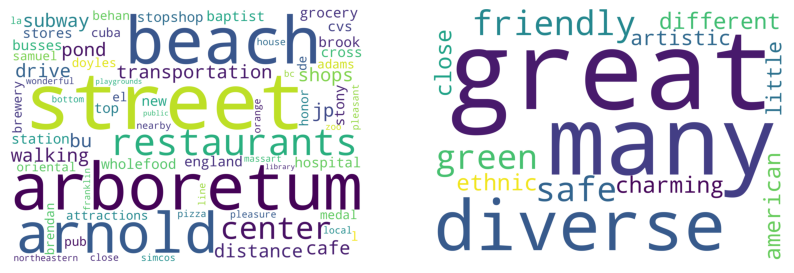


************** Leather District **************
playeatshop station movie theater shopping td
transportation catch red green blue orange
shopping crossings faneuil
entertainment shopping
meeting house financial

Wordcloud for neighborhood Leather District 



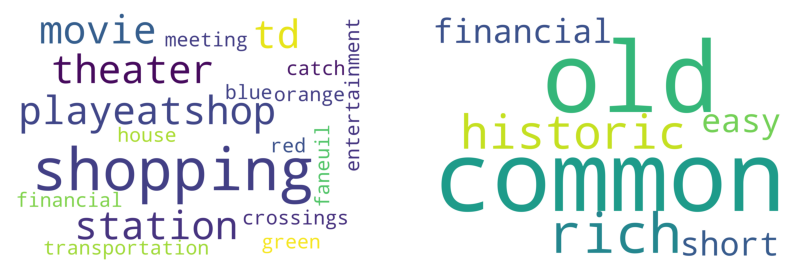


************** Longwood Medical Area **************


coolidge corner steps coolidge corner historic movie theater trader joes
birthplace home steps coolidge corner historic movie theater trader joes
heart coolidge corner steps mbta green c line turn corner
shopping restaurantsmovie theater trader joesstop shop bakerys drug stores coffee shops
transit apartment coolidge corner brookline brookline



Wordcloud for neighborhood Longwood Medical Area 



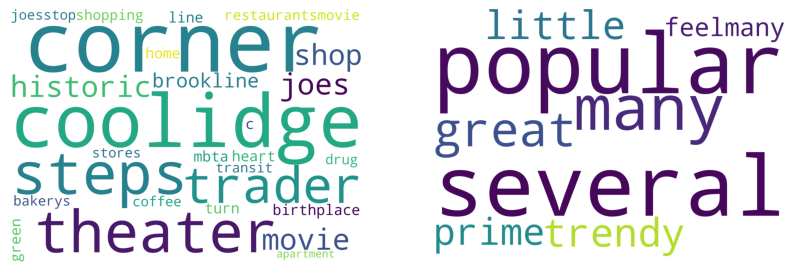


************** Mattapan **************
hospital eastern university wentworth institute technology college beth israel deaconess hospital children hospital brigham woman hospital massachusetts eye ear museum fine arts td garden mit institute
street stores walking distance corner stores supermarket gas stations food restaurants
night day bowls night clubs museums games city name
steel rye homemade ice cream coffee shops restaurants
shops pharmacy ice cream grocery stores riverway mall



Wordcloud for neighborhood Mattapan 



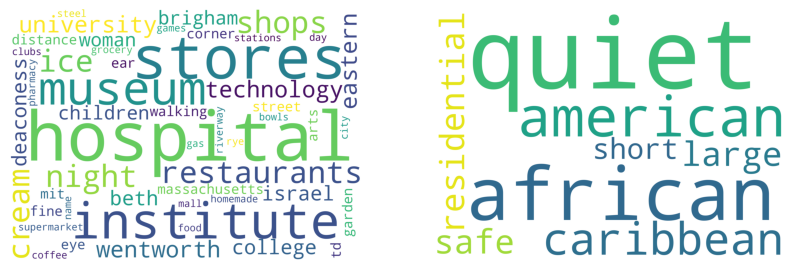


************** Mission Hill **************


tours foot prudential center copley place freedom trail faneuil hall green line green line td garden green line charles river esplanade symphony hall
airport universities harvard school mass college art design mass college pharmacy simmons university university emmanuel northeastern mit tourist spots universities hospitals close
airport universities harvard school mass college art design mass college pharmacy simmons university university emmanuel northeastern mit brookline
walking distance birthplace house museum president john f kennedy frederick olmstead estate isabella stewart gardener museum museum fine arts
airport universities harvard school mass college art design mass college pharmacy simmons university university emmanuel northeastern mit close eline train pond



Wordcloud for neighborhood Mission Hill 



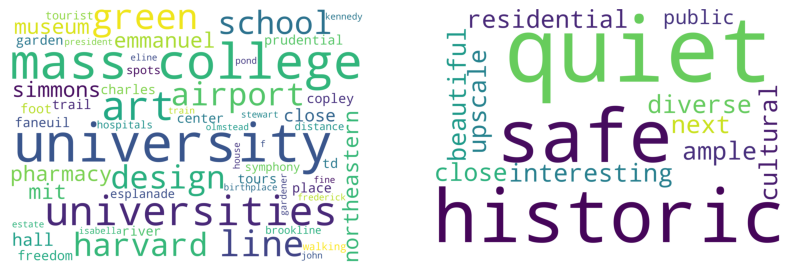


************** North End **************


freedom trail faneuil hall mgh hospitals fun condo heart td garden celtics bruins
faneuil hall live bands street performers td garden faneuil hall waterfrontwater taxi
quincy market faneuil hall aquarium td garden home bruins celtics
location blocks hanover street freedom trail bostons
walking distance restaurant heaven dozens dozens restaurants cafes



Wordcloud for neighborhood North End 



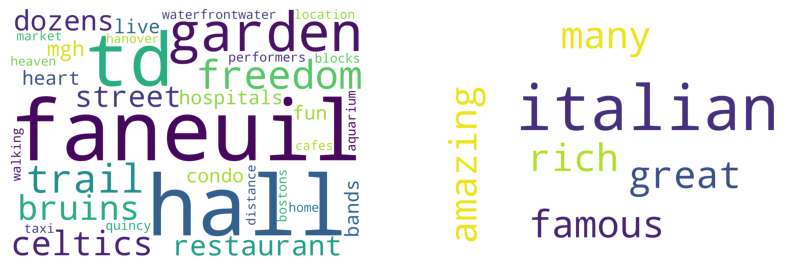


************** Roslindale **************
stony brook reservation arnold arboretum pond franklin prides diversity variety restaurants stores
bus line streets avenue washington street train lines forest hills orange line square commuter rail station square
restaurants wine shops fun gifts shops grocery store thrift store fish market
distance restaurants banks gas stations parks franklin zoo golf course lots restaurants indian
shops restaurants beautiful arnold arboretum harvard university



Wordcloud for neighborhood Roslindale 



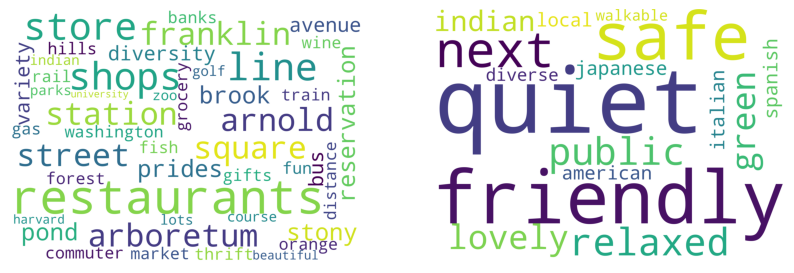


************** Roxbury **************


center street jackson square orange line attractions quincy market institute contemporary art new england aquarium jfk presidential library museum tea party ship museum custom house tower colleges northeastern university university college harvard university
mbta westsite attractions quincy market institute contemporary art new england aquarium jfk presidential library museum tea party ship museum custom house tower colleges northeastern university university college harvard university
franklin zoo arnold arboretum samuel adams brewery museum fine arts isabella stewart gardner museum emerald necklace pond prudential center newbury street
library ymca close stony brook station jackson square station orange line franklin egleston square egleston square
airport uberlyft car plenty onstreet parking bus stop house house victorian style house bostons



Wordcloud for neighborhood Roxbury 



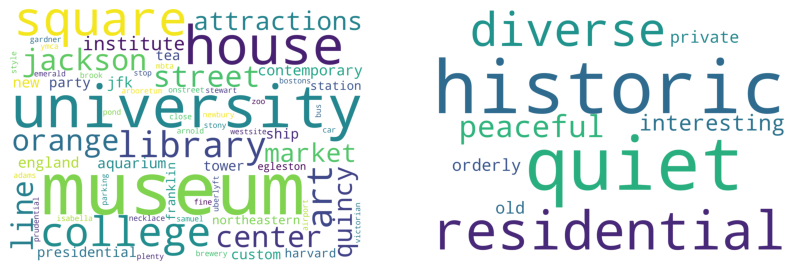


************** South Boston **************


street beach pleasure beach l street beach carson beach
library mi freedom trail faneuil hall market newbury street shopping isabella stewart gardner museum museum fine arts mass general hospital mi logan airport
beach restaurants grocery stores shops walkable convention exhibition center seaport
mi convention center seaport castle island fort independence mi tea party ship museum
couple blocks beach convention center seaport access logan airport house



Wordcloud for neighborhood South Boston 



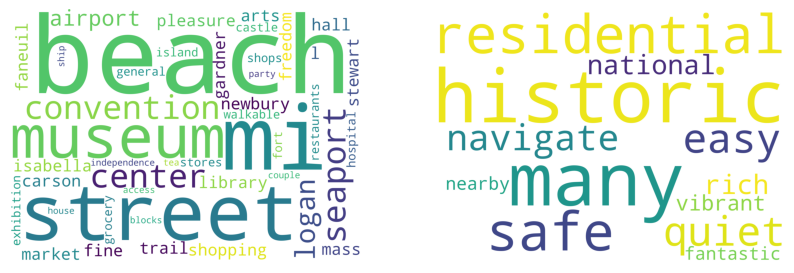


************** South Boston Waterfront **************
groceries trillium flour lolita bastille kitchen blue dragon oak rowan sportello menton drink row bar taco dig inn committee trader joes cvs
blocks ica childrens museum tea party museum restaurants convention center
blue dragon asian fusion oak rowan american cuisine lot
proximity bar pub scene seaport
place base proximity heart city



Wordcloud for neighborhood South Boston Waterfront 



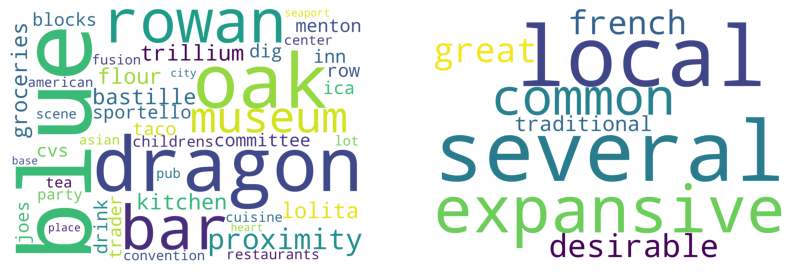


************** South End **************


market restaurants bars foodies supermarket cvs pharmacy train station orange line subway amtrak copley mall copley square copley subway copley hotels westin marriott fairmont public library hancock tower duck tours
shops tremont st walking distance dozens restaurants bars charles river prudential mall public library berklee college bu northeastern university museum fine arts td garden mass
location location location tremont street restaurant row bars center arts bca calderwood pavilion silver line tofrom logan airport washington sowa
restaurant row center arts station subway amtrak newbury street copley square charles river hip lot brag
locations reference mbta station orange line subway train station public library newbury street star market



Wordcloud for neighborhood South End 



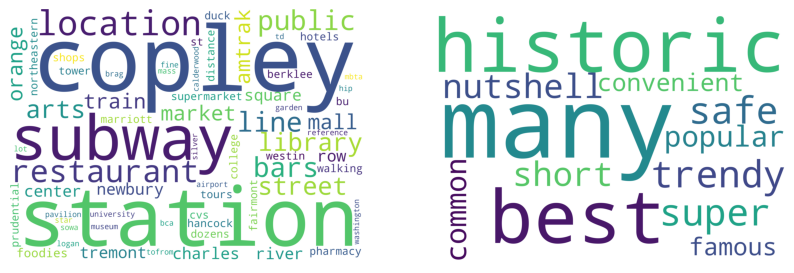


************** West End **************


harvard square banks charles river cambridgeside galleria mall massachusetts institute technology harvard university harvard museum
garden faneuil hall charles river esplanade museum science td garden mass general hospital others community
super market walking charles river plaza charles street famous antique street
entertainment shopping recreation cambridgeside galleria mall massachusetts institute technology harvard university harvard museum
buildings highrise offices borders charles river longfellow bridge charles river dam bridge



Wordcloud for neighborhood West End 



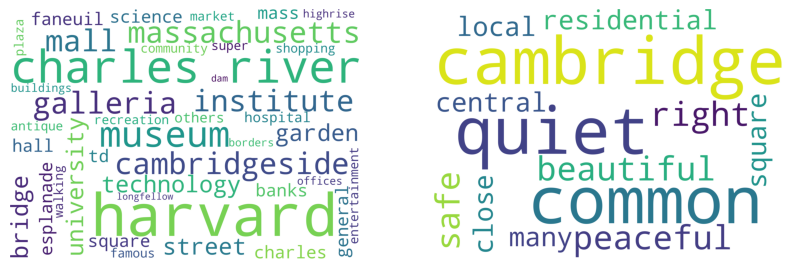


************** West Roxbury **************
walking distance pharmacy cvs banks citizens bank brookline bank restaurants coffee shops
part city walking distance restaurants shopping hospital cvs super market colleges
proximity college university pine manor college country club chestnut mall street newton
bus stop ttrain station restaurants shopping supermarket pharmacy hospital colleges
public transportation heart city commute homestay drive bus stop



Wordcloud for neighborhood West Roxbury 



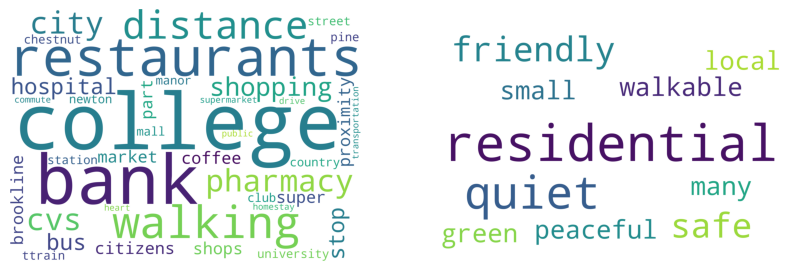

In [1346]:
for key in neighborhood_description.keys():
    keyphrase_lst = [] ; adjectives_lst = []
    print(f'************** {key} **************')
    
    # extract keywords using either textrank or  positionrank extractor
    keyphrases = extract_key_phrases(neighborhood_description[key], 'textrank', {'NOUN','PROPN'})  #textrank, positionrank
    for keyphrase, _ in keyphrases:
        print(keyphrase)
        keyphrase_lst.append(keyphrase)

    adjectives = extract_key_phrases(neighborhood_description[key], 'textrank', {'ADJ'})  #textrank, positionrank
    for adjective, _ in adjectives:
        adjectives_lst.append(adjective)
        
    word_cloud(key, keyphrase_lst, adjectives_lst)
    print()

# Predict price

- our objective is to find the best features to predict the price of a rental property
- we will evaluate a property based on available features provided by hosts on Airbnb platform
- we would like to be able to propose a price-point for a new property not having any reviews or rating yet. Therefore we will exclude those features in a first step to first assess prediction capabilities and performance taking this as a constraint
- we will first examine a combination of continuous, numeric, and categorical features
- we may also include some text features such as the property description, name or bathroom text
- we would like to predict a price for each day over a year



In [1664]:
# these features are specific to the property, its localization (the neighborhood), and the period of interest (date)
# These three categories are expected to have significant prediction power on the property rental price
features = ['date', 'property_type','room_type', 'accommodates','bedrooms','beds','name','description','bathrooms_text','neighbourhood_cleansed','latitude','longitude']  # Note 'bathrooms' does not contain any information and will be excluded
# additional optional features
other_features = ['number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d','reviews_per_month','review_scores_rating']
# dependent variable, ie what we want to predict
target_variable = 'price'

In [1958]:
# At first we will focus on predicting the average property price and exclude the seasonality
# we will also leave aside text features for simplicity -> we are left with 8 features
features = [ 'property_type','room_type', 'accommodates','bedrooms','beds','neighbourhood_cleansed','latitude','longitude','bathrooms_text','amenities','number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d','reviews_per_month','review_scores_rating']

In [1959]:
for feature in ['property_type','room_type', 'accommodates','bedrooms','beds','bathrooms_text']:
    print(f'******************* {feature} *******************')
    print(df2[feature].value_counts())
    print()

******************* property_type *******************
Entire rental unit                    2235
Private room in rental unit            768
Private room in home                   537
Entire condo                           449
Entire home                            272
Entire serviced apartment              222
Private room in condo                  109
Entire guest suite                      88
Room in boutique hotel                  81
Private room in bed and breakfast       79
Private room in townhouse               73
Entire loft                             58
Entire townhouse                        53
Room in hotel                           33
Private room in guest suite             18
Private room in serviced apartment      14
Shared room in rental unit              13
Private room in loft                    11
Entire guesthouse                       11
Boat                                     8
Private room in casa particular          8
Entire place                             5


In [1960]:
subset_df = df2[features+['price']].copy()
subset_df

,property_type,room_type,accommodates,bedrooms,beds,neighbourhood_cleansed,latitude,longitude,bathrooms_text,amenities,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,review_scores_rating,price
0,Private room,Private room,2,NaN,1.0,Brighton,42.351480,-71.193190,1 shared bath,"[""Dishes and silverware"", ""Long term stays all...",0,0,0,NaN,NaN,99.0
1,Entire rental unit,Entire home/apt,2,1.0,1.0,East Boston,42.364130,-71.029910,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",23,2,0,0.26,4.96,132.0
2,Entire guest suite,Entire home/apt,2,1.0,1.0,Roxbury,42.328440,-71.095810,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",113,5,0,0.69,4.78,149.0
3,Entire condo,Entire home/apt,4,NaN,2.0,Roxbury,42.328020,-71.093870,1 bath,"[""Dishes and silverware"", ""Long term stays all...",119,4,2,0.75,4.80,179.0
4,Private room in condo,Private room,1,1.0,1.0,Charlestown,42.390310,-71.093610,1.5 shared baths,"[""Bed linens"", ""Rice maker"", ""Dishes and silve...",295,17,2,1.84,4.89,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.331485,-71.051420,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",0,0,0,NaN,NaN,51.0
5181,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.332679,-71.053346,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",0,0,0,NaN,NaN,51.0
5182,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.333266,-71.051323,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",0,0,0,NaN,NaN,51.0
5183,Private room in rental unit,Private room,2,1.0,1.0,Brighton,42.353218,-71.162178,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",0,0,0,NaN,NaN,51.0


In [1961]:
subset_df.describe()

,accommodates,bedrooms,beds,latitude,longitude,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,review_scores_rating,price
count,5185.000000,4626.000000,5114.000000,5185.000000,5185.000000,5185.000000,5185.000000,5185.000000,3960.000000,3960.000000,5185.000000
mean,3.236451,1.580199,1.840438,42.347183,-71.087871,47.312825,13.194600,1.208293,1.805780,4.690366,230.596914
std,2.196821,0.974124,1.364078,0.030469,0.037270,88.400462,22.819485,2.173469,2.000066,0.474532,306.198549
min,0.000000,1.000000,1.000000,42.231170,-71.201970,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000
25%,2.000000,1.000000,1.000000,42.332650,-71.112354,1.000000,0.000000,0.000000,0.310000,4.610000,100.000000
50%,2.000000,1.000000,1.000000,42.350230,-71.083360,9.000000,2.000000,0.000000,1.060000,4.810000,179.000000
75%,4.000000,2.000000,2.000000,42.366580,-71.063140,54.000000,17.000000,2.000000,2.660000,4.960000,275.000000
max,16.000000,13.000000,22.000000,42.410820,-70.913250,1100.000000,256.000000,19.000000,18.110000,5.000000,10000.000000


### missing data
- about 11% of the bedrooms are missing and 1% beds
- we will impute beds based on the number of accomodates and predict bedrooms based on beds

In [1962]:
(subset_df.isna().sum(axis=0) / len(subset_df) *100).round(2)

property_type              0.00
room_type                  0.00
accommodates               0.00
bedrooms                  10.78
beds                       1.37
neighbourhood_cleansed     0.00
latitude                   0.00
longitude                  0.00
bathrooms_text             0.14
amenities                  0.00
number_of_reviews          0.00
number_of_reviews_ltm      0.00
number_of_reviews_l30d     0.00
reviews_per_month         23.63
review_scores_rating      23.63
price                      0.00
dtype: float64

In [1963]:
def impute_missing_beds(row):
    if pd.isnull(row['beds']):
        # we assume double beds and complement with a simple bed
        row['beds'] = row['accommodates'] // 2 + row['accommodates'] % 2
    return row

In [1964]:
subset_df = subset_df.apply(impute_missing_beds, axis=1)

In [1965]:
temp = subset_df.dropna(axis=0)
#Create a Linear Regression model to estimate the missing data
bedroom_imputer = linear_model.LinearRegression()
bedroom_imputer.fit(X = temp[['beds','accommodates']].values, y = temp['bedrooms'])

LinearRegression()

In [1966]:
def impute_missing_bedrooms(row):
    if pd.isnull(row['bedrooms']):
        # we predict the number of bedrooms using beds and accommodates
        row['bedrooms'] = np.ceil(bedroom_imputer.predict([row[['beds','accommodates']]]).item())
    return row

In [1967]:
subset_df = subset_df.apply(impute_missing_bedrooms, axis=1)

In [1968]:
def impute_reviews_per_month(row):
    if pd.isna(row['reviews_per_month']):
        row['reviews_per_month'] = row['number_of_reviews_ltm'] / 12
    return row

In [1969]:
subset_df = subset_df.apply(impute_reviews_per_month, axis=1)

In [1970]:
bathroom_imputer = SimpleImputer(strategy='most_frequent')
bathroom_imputer.fit(subset_df[['review_scores_rating','bathrooms_text']])

SimpleImputer(strategy='most_frequent')

In [1971]:
subset_df.loc[:,['review_scores_rating','bathrooms_text']] = bathroom_imputer.fit_transform(subset_df[['review_scores_rating','bathrooms_text']])

In [1972]:
(subset_df.isna().sum(axis=0) / len(subset_df) *100).round(2)

property_type             0.0
room_type                 0.0
accommodates              0.0
bedrooms                  0.0
beds                      0.0
neighbourhood_cleansed    0.0
latitude                  0.0
longitude                 0.0
bathrooms_text            0.0
amenities                 0.0
number_of_reviews         0.0
number_of_reviews_ltm     0.0
number_of_reviews_l30d    0.0
reviews_per_month         0.0
review_scores_rating      0.0
price                     0.0
dtype: float64

In [1973]:
subset_df

,property_type,room_type,accommodates,bedrooms,beds,neighbourhood_cleansed,latitude,longitude,bathrooms_text,amenities,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,review_scores_rating,price
0,Private room,Private room,2,2.0,1.0,Brighton,42.351480,-71.193190,1 shared bath,"[""Dishes and silverware"", ""Long term stays all...",0,0,0,0.00,5.00,99.0
1,Entire rental unit,Entire home/apt,2,1.0,1.0,East Boston,42.364130,-71.029910,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",23,2,0,0.26,4.96,132.0
2,Entire guest suite,Entire home/apt,2,1.0,1.0,Roxbury,42.328440,-71.095810,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",113,5,0,0.69,4.78,149.0
3,Entire condo,Entire home/apt,4,2.0,2.0,Roxbury,42.328020,-71.093870,1 bath,"[""Dishes and silverware"", ""Long term stays all...",119,4,2,0.75,4.80,179.0
4,Private room in condo,Private room,1,1.0,1.0,Charlestown,42.390310,-71.093610,1.5 shared baths,"[""Bed linens"", ""Rice maker"", ""Dishes and silve...",295,17,2,1.84,4.89,116.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.331485,-71.051420,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",0,0,0,0.00,5.00,51.0
5181,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.332679,-71.053346,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",0,0,0,0.00,5.00,51.0
5182,Private room in rental unit,Private room,2,1.0,1.0,South Boston,42.333266,-71.051323,1 bath,"[""Long term stays allowed"", ""Stove"", ""Wifi"", ""...",0,0,0,0.00,5.00,51.0
5183,Private room in rental unit,Private room,2,1.0,1.0,Brighton,42.353218,-71.162178,1 bath,"[""Bed linens"", ""Dishes and silverware"", ""Long ...",0,0,0,0.00,5.00,51.0


- let's make one-hot vector of these amenities elements

In [1974]:
from itertools import chain

In [1975]:
amenities_lst = set()
for elements in subset_df.amenities:
    amenities_lst.update(ast.literal_eval(elements))
amenities_items= set()
for item in amenities_lst:
    amenities_items.update(item.split(', '))
print(f'We isolated a list of {len(amenities_items)} different amenities')

We isolated a list of 1125 different amenities


In [1977]:
# Ititialize a 0-vector for each item
for item in amenities_items:
    subset_df[item] = 0

subset_df['amenities_copy'] = subset_df['amenities'].copy()
subset_df['amenities_copy'] = subset_df['amenities_copy'].progress_apply(lambda x: [i.split(', ') for i in ast.literal_eval(x)])
subset_df['amenities_copy'] = subset_df['amenities_copy'].progress_apply(lambda x: list(chain(*x)))
# populate the vector for existing items at each rental property
for item in tqdm(amenities_items):
    subset_df[item] = subset_df['amenities_copy'].apply(lambda x: 1 if item in x else 0)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1125/1125 [00:07<00:00, 159.44it/s]


In [1978]:
# check populated vector columns
subset_df[list(amenities_items)].sum().sum()

153024

In [1979]:
subset_df[list(amenities_items)]

,Jason body soap,House bikes,open specific hours,"55"" HDTV with premium cable",Head & Shoulders shampoo,Kitchen,TV with Netflix,HDTV with Chromecast,Fast wifi – 79 Mbps,"35"" HDTV with standard cable",...,Pets allowed,Honest body soap,"54"" HDTV with Netflix",Dryer – In unit,Laundromat nearby,and closet,Fast wifi – 117 Mbps,Changing table,Paid parking lot on premises – 1 space,Fast wifi – 157 Mbps
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5181,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5182,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5183,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [1980]:
subset_df.drop(['amenities','amenities_copy'], axis=1, inplace=True)

In [1981]:
subset_df.shape

(5185, 1140)

In [1985]:
subset_df[list(amenities_items)].sum(axis=0).sort_values(ascending=False).head(20)

Smoke alarm                4986
Wifi                       4889
Long term stays allowed    4875
Carbon monoxide alarm      4745
Kitchen                    4660
Essentials                 4477
Hangers                    4320
Heating                    4212
Hair dryer                 4191
Iron                       4152
Hot water                  3941
Shampoo                    3807
Refrigerator               3738
Microwave                  3659
Coffee maker               3502
Air conditioning           3434
Dishes and silverware      3313
Bed linens                 3242
Cooking basics             3034
Fire extinguisher          2965
dtype: int64

<AxesSubplot:ylabel='Frequency'>

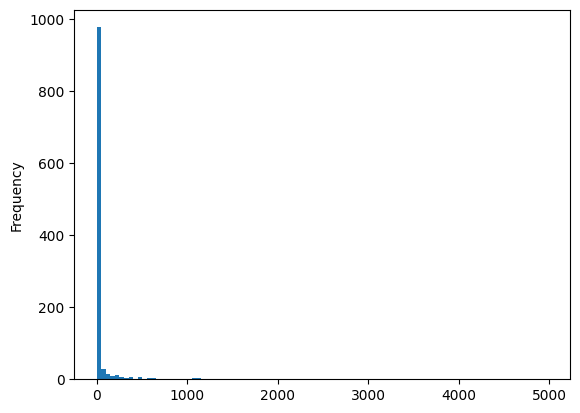

In [1947]:
subset_df[list(amenities_items)].sum(axis=0).sort_values(ascending=False).plot(kind='hist', bins=100)

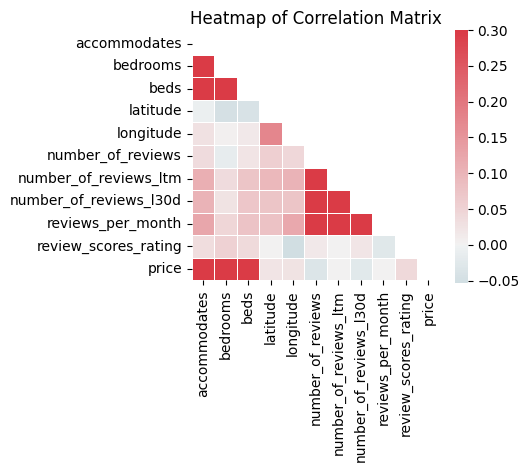

In [1940]:
# Generate our correlation plot or heatmap
corr = subset_df[features+['price']].corr(numeric_only=True)
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize = (4,4))
cmap = sns.diverging_palette(220,10,as_cmap = True)
sns.heatmap(corr,xticklabels=corr.columns.values, yticklabels=corr.columns.values,cmap=cmap,vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .82}, mask=mask)
plt.title('Heatmap of Correlation Matrix')
plt.show()

- as expected accommodates, bedrooms and beds are highly correlated together.
- price appears to have strong correlation with these 3 features

In [2003]:
df_without_amenities = subset_df[subset_df.columns.intersection(features+['price'])].copy()
df_without_amenities.columns

Index(['property_type', 'room_type', 'accommodates', 'bedrooms', 'beds',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'bathrooms_text',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'reviews_per_month', 'review_scores_rating', 'price'],
      dtype='object')

#### Drop Outliers



In [1997]:
def drop_outliers(df, target):
    y = df[target]
    IQR =  y.quantile(0.75) - y.quantile(0.25)
    upper_lim = y.quantile(0.75) + 1.5 * IQR
    lower_lim = max(0, y.quantile(0.25) - 1.5 * IQR)
    boolean_filter = y.between(lower_lim, upper_lim)
    return df[boolean_filter]

In [1998]:
def data_segregation(df, target, cat_features, drop_outlier=False):
    
    if drop_outlier:
        df = drop_outliers(df, target)
    
    X = df.copy()
    y = X.pop(target)
    print(f'X shape before one-hot encoding {X.shape}')
    
    dummy_cols_X = pd.get_dummies(X[cat_features], dummy_na=False, prefix=cat_features, drop_first=True)
    X = pd.concat([X, dummy_cols_X], axis=1)
    X.drop(cat_features, axis=1, inplace=True)
    print(f'X shape after one-hot encoding {X.shape}')
    
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=10)
    
    return X_train, X_test, y_train, y_test

In [1999]:
cat_column_idx = np.where(subset_df.dtypes == object)[0]
cat_features = subset_df.columns[cat_column_idx].tolist()
cat_features

['property_type', 'room_type', 'neighbourhood_cleansed', 'bathrooms_text']

In [2000]:
X_train, X_test, y_train, y_test = data_segregation(subset_df, 'price', cat_features, drop_outlier=True)

X shape before one-hot encoding (4921, 1139)
X shape after one-hot encoding (4921, 1227)


In [2004]:
X_train_wo_amenities, X_test_wo_amenities, y_train_wo_amenities, y_test_wo_amenities = data_segregation(df_without_amenities, 'price', cat_features, drop_outlier=True)

X shape before one-hot encoding (4921, 14)
X shape after one-hot encoding (4921, 102)


In [1688]:
def identity_line(ax=None, ls='--', *args, **kwargs):
    # see: https://stackoverflow.com/q/22104256/3986320
    ax = ax or plt.gca()
    identity, = ax.plot([], [], ls=ls,  label='Identity line', *args, **kwargs)
    def callback(axes):
        low_x, high_x = ax.get_xlim()
        low_y, high_y = ax.get_ylim()
        low = min(low_x, low_y)
        high = max(high_x, high_y)
        identity.set_data([low, high], [low, high])
    callback(ax)
    ax.callbacks.connect('xlim_changed', callback)
    ax.callbacks.connect('ylim_changed', callback)
    return ax

def plot_predictions(targets,preds):
    # Distinguer one feature
    f, ax = plt.subplots(figsize=(6,6))
    colors = ['red','blue','green','grey']
    idx = {}; y_valid_n={}; pred_n={}

    plt.scatter(targets, preds, alpha=0.3)
    plt.title("Predicted price vs actual prices (linear regression)")
    plt.xlabel("Actual prices")
    plt.ylabel("Predicted prices")
    plt.xlim(0); plt.ylim(0)
    identity_line(ax)
    plt.legend()
    plt.show()

The r-squared score for the model is 0.58 on 985 values.


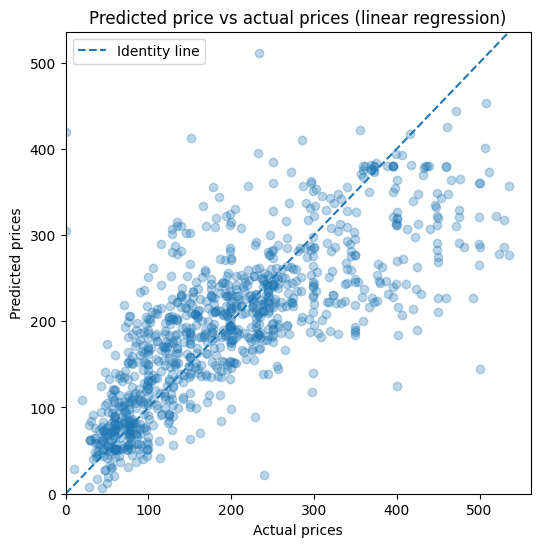

In [2006]:
# Instantiate and fit the linear model
#lm_model = make_pipeline(StandardScaler(with_mean=True), LinearRegression())
lm_model = LinearRegression()
lm_model.fit(X_train_wo_amenities, y_train_wo_amenities) 
        
#Predict and score the model
y_test_preds = lm_model.predict(X_test_wo_amenities)
y_test_preds = np.clip(y_test_preds, None, 10000)
print(f"The r-squared score for the model is {r2_score(y_test_wo_amenities, y_test_preds):.2f} on {len(y_test_wo_amenities)} values.")
plot_predictions(y_test_wo_amenities,y_test_preds)

In [1721]:
'''# these features are specific to the property, its localization (the neighborhood), and the period of interest (date)
# These three categories are expected to have significant prediction power on the property rental price
features = ['property_type','room_type', 'accommodates','bedrooms','beds','neighbourhood_cleansed','latitude','longitude','number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d','reviews_per_month','review_scores_rating']  # Note 'bathrooms' does not contain any information and will be excluded
# dependent variable, ie what we want to predict
target_variable = 'price''''

In [2007]:
'''subset_df = df2[features+['price']].copy()
subset_df'''

"subset_df = df2[features+['price']].copy()\nsubset_df"

In [2008]:
'''(subset_df.isna().sum(axis=0) / len(subset_df) *100).round(1)'''

'(subset_df.isna().sum(axis=0) / len(subset_df) *100).round(1)'

In [2009]:
'''subset_df = subset_df.apply(impute_missing_beds, axis=1)
subset_df = subset_df.apply(impute_missing_bedrooms, axis=1)'''

'subset_df = subset_df.apply(impute_missing_beds, axis=1)\nsubset_df = subset_df.apply(impute_missing_bedrooms, axis=1)'

In [2010]:
'''def impute_reviews_per_month(row):
    if pd.isna(row['reviews_per_month']):
        row['reviews_per_month'] = row['number_of_reviews_ltm'] / 12
    return row'''

"def impute_reviews_per_month(row):\n    if pd.isna(row['reviews_per_month']):\n        row['reviews_per_month'] = row['number_of_reviews_ltm'] / 12\n    return row"

In [2011]:
'''subset_df = subset_df.apply(impute_reviews_per_month, axis=1)'''

'subset_df = subset_df.apply(impute_reviews_per_month, axis=1)'

In [2012]:
'''most_frequent_item = subset_df['review_scores_rating'].mode().item()
subset_df.loc[:,'review_scores_rating'].fillna(most_frequent_item, inplace=True)'''

"most_frequent_item = subset_df['review_scores_rating'].mode().item()\nsubset_df.loc[:,'review_scores_rating'].fillna(most_frequent_item, inplace=True)"

In [2013]:
'''(subset_df.isna().sum(axis=0) / len(subset_df) *100).round(1)'''

'(subset_df.isna().sum(axis=0) / len(subset_df) *100).round(1)'

In [2014]:
'''cat_column_idx = np.where(subset_df.dtypes == object)[0]
cat_features = subset_df.columns[cat_column_idx].tolist()
cat_features'''

'cat_column_idx = np.where(subset_df.dtypes == object)[0]\ncat_features = subset_df.columns[cat_column_idx].tolist()\ncat_features'

In [2015]:
'''X_train, X_test, y_train, y_test = data_segregation(subset_df, 'price', cat_features, drop_outlier=True)'''

"X_train, X_test, y_train, y_test = data_segregation(subset_df, 'price', cat_features, drop_outlier=True)"

The r-squared score for the model is 0.65 on 985 values.


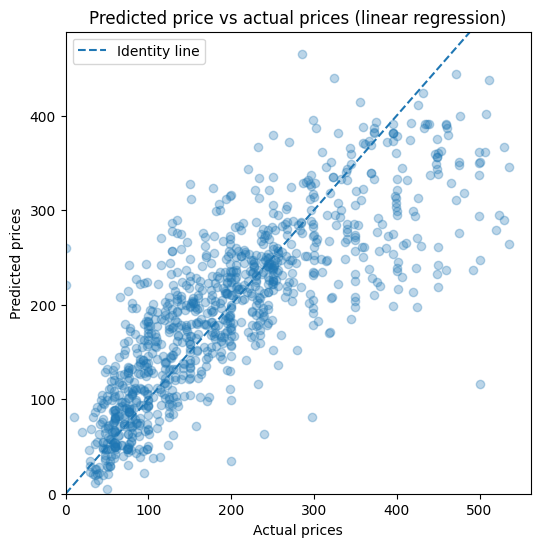

In [2019]:
# Instantiate and fit the linear model
#lm_model = make_pipeline(StandardScaler(with_mean=True), Ridge(alpha=10))
ridge_model = Ridge(alpha=10)
ridge_model.fit(X_train, y_train) 
        
#Predict and score the model
y_test_preds = ridge_model.predict(X_test)
#y_test_preds = np.clip(y_test_preds, None, 10000)
print(f"The r-squared score for the model is {r2_score(y_test, y_test_preds):.2f} on {len(y_test)} values.")
plot_predictions(y_test,y_test_preds)

In [2026]:
from lineartree import LinearTreeRegressor, LinearBoostRegressor, LinearForestRegressor
from sklearn.preprocessing import PolynomialFeatures

In [2046]:
# Fit on train dataset
simple_lt = LinearTreeRegressor(base_estimator=Ridge(alpha=10))
simple_lt.fit(X_train_wo_amenities, y_train_wo_amenities)

# evaluate on validation dataset
pred_simple_lt = pd.Series(simple_lt.predict(X_test_wo_amenities), index=y_test_wo_amenities.index, name='LinearBoosting')
score = round(mean_squared_error(y_test_wo_amenities, pred_simple_lt, squared=False),4)

print('BEST PARAMS: ', simple_lt.get_params())
print('TEST RMSE: ', score)

BEST PARAMS:  {'base_estimator__alpha': 10, 'base_estimator__copy_X': True, 'base_estimator__fit_intercept': True, 'base_estimator__max_iter': None, 'base_estimator__normalize': 'deprecated', 'base_estimator__positive': False, 'base_estimator__random_state': None, 'base_estimator__solver': 'auto', 'base_estimator__tol': 0.001, 'base_estimator': Ridge(alpha=10), 'categorical_features': None, 'criterion': 'mse', 'linear_features': None, 'max_bins': 25, 'max_depth': 5, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 0.1, 'min_samples_split': 6, 'n_jobs': None, 'split_features': None}
TEST RMSE:  72.9642


The r-squared score for the model is 0.61 on 985 values.


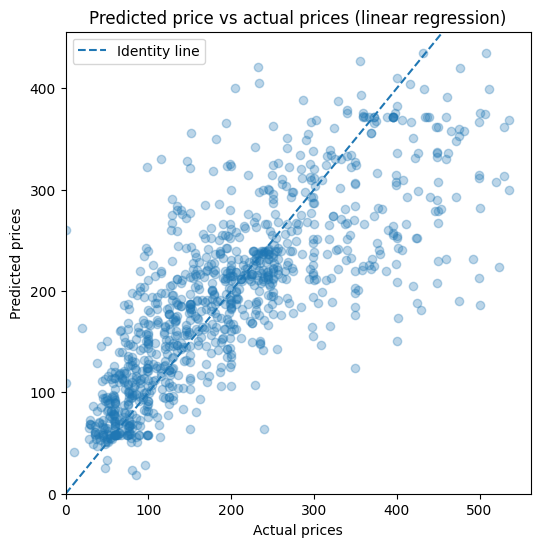

In [2047]:
print(f"The r-squared score for the model is {r2_score(y_test, pred_simple_lt):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred_simple_lt)

BEST PARAMS:  {'base_estimator__alpha': 10, 'base_estimator__copy_X': True, 'base_estimator__fit_intercept': True, 'base_estimator__max_iter': None, 'base_estimator__normalize': 'deprecated', 'base_estimator__positive': False, 'base_estimator__random_state': None, 'base_estimator__solver': 'auto', 'base_estimator__tol': 0.001, 'base_estimator': Ridge(alpha=10), 'bootstrap': True, 'ccp_alpha': 0.0, 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None}
TEST RMSE:  66.7812
The r-squared score for the model is 0.68 on 985 values.


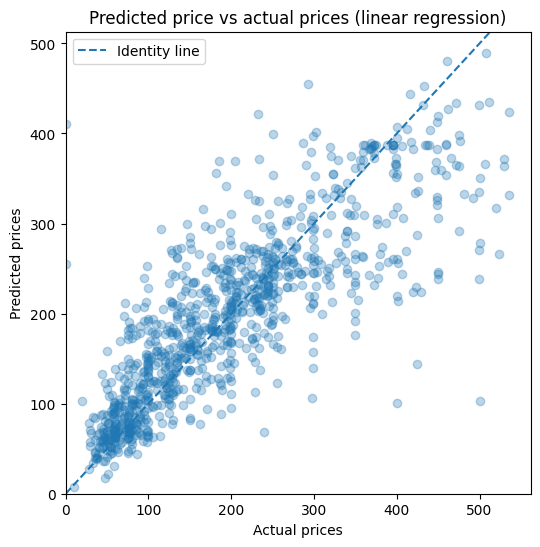

In [2042]:
lf = LinearForestRegressor(base_estimator=Ridge(alpha=10), max_features=1.0)
lf.fit(X_train_wo_amenities, y_train_wo_amenities)
pred_simple_lin_forest = pd.Series(lf.predict(X_test_wo_amenities), index=y_test_wo_amenities.index, name='Simple Linear Forest')
score = round(mean_squared_error(y_test_wo_amenities, pred_simple_lin_forest, squared=False),4)

print('BEST PARAMS: ', lf.get_params())
print('TEST RMSE: ', score)

print(f"The r-squared score for the model is {r2_score(y_test_wo_amenities, pred_simple_lin_forest):.2f} on {len(y_test)} values.")
plot_predictions(y_test_wo_amenities,pred_simple_lin_forest)

make_noise()

BEST PARAMS:  {'base_estimator__alpha': 10, 'base_estimator__copy_X': True, 'base_estimator__fit_intercept': True, 'base_estimator__max_iter': None, 'base_estimator__normalize': 'deprecated', 'base_estimator__positive': False, 'base_estimator__random_state': None, 'base_estimator__solver': 'auto', 'base_estimator__tol': 0.001, 'base_estimator': Ridge(alpha=10), 'bootstrap': True, 'ccp_alpha': 0.0, 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None}
TEST RMSE:  62.1904
The r-squared score for the model is 0.72 on 985 values.


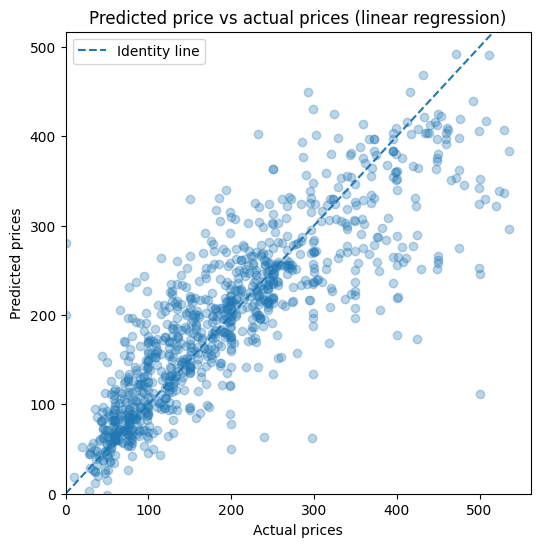

In [2043]:
lf = LinearForestRegressor(base_estimator=Ridge(alpha=10), max_features=1.0)
lf.fit(X_train, y_train)
pred_simple_lin_forest = pd.Series(lf.predict(X_test), index=y_test.index, name='Simple Linear Forest')
score = round(mean_squared_error(y_test, pred_simple_lin_forest, squared=False),4)

print('BEST PARAMS: ', lf.get_params())
print('TEST RMSE: ', score)

print(f"The r-squared score for the model is {r2_score(y_test, pred_simple_lin_forest):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred_simple_lin_forest)

make_noise()

In [1786]:
olrf = GridSearchCV(
                            LinearForestRegressor(base_estimator=LinearRegression(),max_features=1.0)  ,                   #  Ridge(alpha=3) min_samples_split=60, min_samples_leaf=20, max_leaf_nodes=1030,
                            param_grid={
                                        'n_estimators': [500, 800, 1000, 1200],
                                        'max_depth': [12, 14, 16, 18, 20],
                                        'min_samples_split':[2,5,10]
                                        }, cv=3, n_jobs=6
                        )

olrf.fit(X_train, y_train)
pred_optimized_lrf = pd.Series(olrf.predict(X_test), index=y_test.index, name='Optimized Linear Random Forest')
score = round(mean_squared_error(y_test, pred_optimized_lrf, squared=False),4)

print('BEST PARAMS: ', olrf.best_params_)
print('TEST RMSE: ', score)

make_noise()

BEST PARAMS:  {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 500}
TEST RMSE:  67.5095


The r-squared score for the model is 0.67 on 985 values.


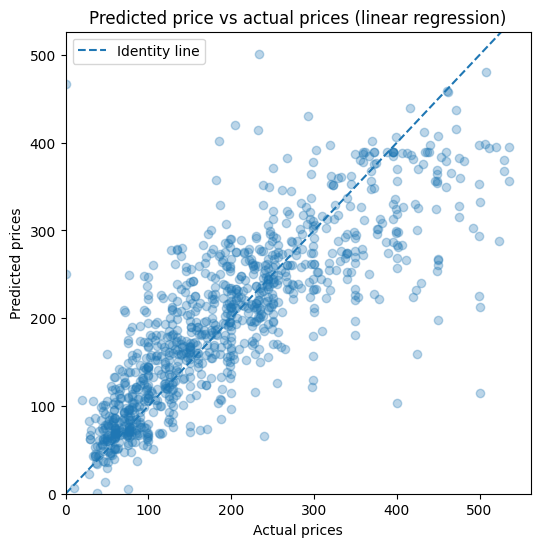

In [1787]:
print(f"The r-squared score for the model is {r2_score(y_test, pred_optimized_lrf):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred_optimized_lrf)

In [2048]:
from xgboost import XGBRegressor
xgb = XGBRegressor(n_estimators = 50, n_jobs=-1, random_state=10,  ) # gpu_id=0,tree_method='gpu_hist',enable_categorical=True,
xgb.fit(X_train, y_train)

pred = xgb.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 61.28
R2: 0.73


The r-squared score for the model is 0.73 on 985 values.


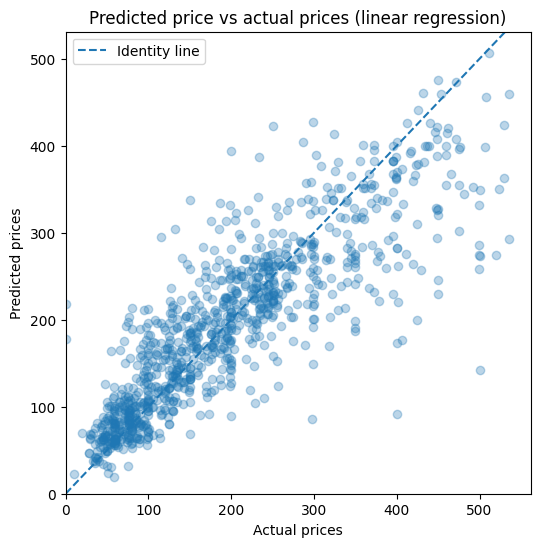

In [2049]:
print(f"The r-squared score for the model is {r2_score(y_test, pred):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred)

BEST PARAMS:  {'lambda': 10, 'max_depth': 4, 'n_estimators': 200}
Testing performance
RMSE: 62.51
R2: 0.72
The r-squared score for the model is 0.72 on 985 values.


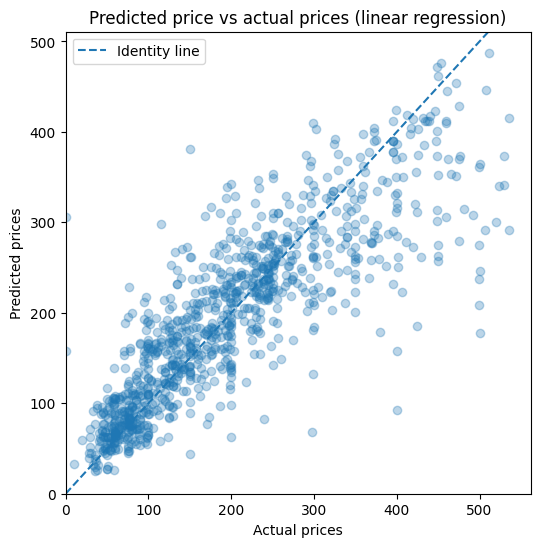

In [2056]:
xgb_optim = GridSearchCV( XGBRegressor(random_state=10) ,  
                            param_grid={
                                        'n_estimators': [20, 30, 50, 60, 100, 200],
                                        'max_depth': [4, 6, 8, 12],
                                        'lambda':[1,5,10]
                                        }, cv=3, n_jobs=10,
                        )
xgb_optim.fit(X_train, y_train)

print('BEST PARAMS: ', xgb_optim.best_params_)
pred = xgb_optim.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

print(f"The r-squared score for the model is {r2_score(y_test, pred):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred)

make_noise()

TEST RMSE:  74.6081
The r-squared score for the model is 0.60 on 985 values.


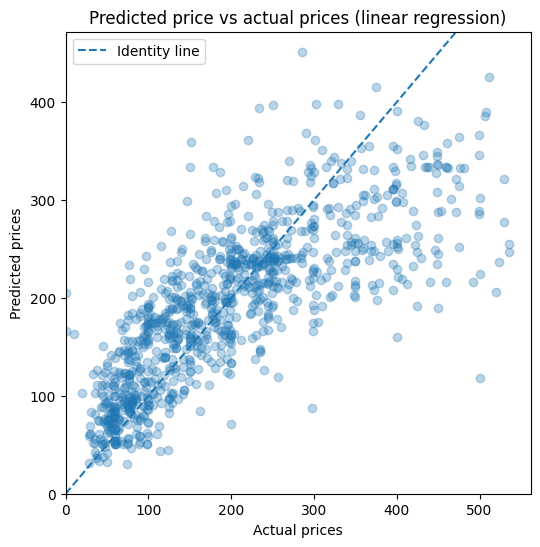

In [2050]:
# Instantiate and fit the linear model
lasso_model = Lasso()
lasso_model.fit(X_train, y_train) 
        
#Predict and score the model
y_test_preds = lasso_model.predict(X_test)

score = round(mean_squared_error(y_test, y_test_preds, squared=False),4)
print('TEST RMSE: ', score)

print(f"The r-squared score for the model is {r2_score(y_test, y_test_preds):.2f} on {len(y_test)} values.")
plot_predictions(y_test,y_test_preds)

# Adding textual features

In [2186]:
features_text = ['name','description']
df2[features_text]

,name,description
0,TudorStudio,the studio weldon located newton feels like mi...
1,HARBORSIDE-Walk to subway,fully separate apartment two apartment buildin...
2,** Fort Hill Inn Private! Minutes to center!**,private guest room private bath you need cut a...
3,"Fort Hill Inn *Sunny* 1 bedroom, condo duplex",comfortable fully equipped private apartment l...
4,"Colorful, modern 2 BR apt shared with host",im high school teacher frequent traveler airbn...
...,...,...
5180,Private Room with Shared Bath in Quiet Street,please note you booking private room shared ap...
5181,Cozy Bedroom in Convenient Downtown Location,please note you booking private room shared ap...
5182,"Peaceful Bedroom w/ Shared Bath - AC, Wifi inc...",please note you booking private room shared ap...
5183,Sunny Room w/ Shared Bath in Modest Brighton Home,perfect hospital stays medical students profes...


In [2187]:
df2['description'].values

array(['the studio weldon located newton feels like million miles city quick minute trek back bay boston cozy villages newton nearby classic british tudorstyle home free secure offstreet parking minute walk mbta rail express bus back bay downtown fully appointed kitchen bath laundry comfy living space cable tv free wifi hot tub deck available small fee bthe spaceb warm friendly space separate entrance private studio private tudorstyle home quiet newton culdusac designer space warm wooden floors full kitchen private entrance full bath sf free onsite parking not able accommodate pets sorry min masspike exit min boston college law school min walk mbta commuter railnewtonville station bguest accessb kitchen bathroom wifi laudry room cable access free hot tub acces',
       'fully separate apartment two apartment building space perfect individual couple there full bath bedroom queen bed small sitting area tv fully equipped kitchen dining area walk bus subway bthe spaceb this totally separat

In [2188]:
df2['name'].values

array(['TudorStudio', 'HARBORSIDE-Walk to subway',
       '** Fort Hill Inn Private! Minutes to center!**', ...,
       'Peaceful Bedroom w/ Shared Bath - AC, Wifi included',
       'Sunny Room w/ Shared Bath in Modest Brighton Home',
       'Charming Room in Modern Shared Spacious Apt'], dtype=object)

In [2063]:
df2[features_text].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5185 entries, 0 to 5184
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   name         5185 non-null   object
 1   description  5140 non-null   object
dtypes: object(2)
memory usage: 81.1+ KB


In [2189]:
def impute_missing_description(row):
    """fill missing descriptions with name text"""
    if pd.isnull(row['description']):
        row['description'] = row['name']
    return row

df2 = df2.apply(impute_missing_description, axis=1)

In [2190]:
df2[features_text].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5185 entries, 0 to 5184
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   name         5185 non-null   object
 1   description  5185 non-null   object
dtypes: object(2)
memory usage: 81.1+ KB


In [2095]:
# Preprocessing text with cleaning step
df2['description'] = df2['description'].apply(lambda x: preprocess_text(x, set(stopwords.words("english"))))

In [2096]:
df2['description'].values

array(['the studio weldon located newton feels like million miles city quick minute trek back bay boston cozy villages newton nearby classic british tudorstyle home free secure offstreet parking minute walk mbta rail express bus back bay downtown fully appointed kitchen bath laundry comfy living space cable tv free wifi hot tub deck available small fee bthe spaceb warm friendly space separate entrance private studio private tudorstyle home quiet newton culdusac designer space warm wooden floors full kitchen private entrance full bath sf free onsite parking not able accommodate pets sorry min masspike exit min boston college law school min walk mbta commuter railnewtonville station bguest accessb kitchen bathroom wifi laudry room cable access free hot tub acces',
       'fully separate apartment two apartment building space perfect individual couple there full bath bedroom queen bed small sitting area tv fully equipped kitchen dining area walk bus subway bthe spaceb this totally separat

In [2100]:
df2 = df2.apply(impute_missing_beds, axis=1)
df2 = df2.apply(impute_missing_bedrooms, axis=1)
df2 = df2.apply(impute_reviews_per_month, axis=1)
df2.loc[:,['review_scores_rating','bathrooms_text']] = bathroom_imputer.fit_transform(df2[['review_scores_rating','bathrooms_text']])

In [2101]:
amenities_lst = set()
for elements in df2.amenities:
    amenities_lst.update(ast.literal_eval(elements))
amenities_items= set()
for item in amenities_lst:
    amenities_items.update(item.split(', '))
print(f'We isolated a list of {len(amenities_items)} different amenities')

# Ititialize a 0-vector for each item
for item in amenities_items:
    df2[item] = 0

df2['amenities_copy'] = df2['amenities'].copy()
df2['amenities_copy'] = df2['amenities_copy'].progress_apply(lambda x: [i.split(', ') for i in ast.literal_eval(x)])
df2['amenities_copy'] = df2['amenities_copy'].progress_apply(lambda x: list(chain(*x)))
# populate the vector for existing items at each rental property
for item in tqdm(amenities_items):
    df2[item] = df2['amenities_copy'].apply(lambda x: 1 if item in x else 0)
df2.drop(['amenities','amenities_copy'], axis=1, inplace=True)

We isolated a list of 1125 different amenities


C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lveys\AppData\Local\Temp\ipykernel_63988\2466925059.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragment

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1125/1125 [00:07<00:00, 156.60it/s]


In [2110]:
features = ['description', 'property_type','room_type', 'accommodates','bedrooms','beds','neighbourhood_cleansed','latitude','longitude','bathrooms_text','number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d','reviews_per_month','review_scores_rating']
amenities_features = list(amenities_items)

In [2191]:
subset_df = df2[df2.columns.intersection(features+amenities_features+['price'])].copy()
(subset_df[features+['price']].isna().sum(axis=0) / len(subset_df) *100).round(2)

description               0.0
property_type             0.0
room_type                 0.0
accommodates              0.0
bedrooms                  0.0
beds                      0.0
neighbourhood_cleansed    0.0
latitude                  0.0
longitude                 0.0
bathrooms_text            0.0
number_of_reviews         0.0
number_of_reviews_ltm     0.0
number_of_reviews_l30d    0.0
reviews_per_month         0.0
review_scores_rating      0.0
price                     0.0
dtype: float64

In [2113]:
subset_df.head()

,description,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,...,Pets allowed,Honest body soap,"54"" HDTV with Netflix",Dryer – In unit,Laundromat nearby,and closet,Fast wifi – 117 Mbps,Changing table,Paid parking lot on premises – 1 space,Fast wifi – 157 Mbps
0,the studio weldon located newton feels like mi...,Brighton,42.35148,-71.19319,Private room,Private room,2,1 shared bath,2.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,fully separate apartment two apartment buildin...,East Boston,42.36413,-71.02991,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
2,private guest room private bath you need cut a...,Roxbury,42.32844,-71.09581,Entire guest suite,Entire home/apt,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,comfortable fully equipped private apartment l...,Roxbury,42.32802,-71.09387,Entire condo,Entire home/apt,4,1 bath,2.0,2.0,...,0,0,0,0,0,0,0,0,0,0
4,im high school teacher frequent traveler airbn...,Charlestown,42.39031,-71.09361,Private room in condo,Private room,1,1.5 shared baths,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0


In [2114]:
subset_df.shape

(5185, 1141)

In [2115]:
cat_column_idx = np.where(subset_df.dtypes == object)[0]
cat_features = subset_df.columns[cat_column_idx].tolist()
cat_features

['description',
 'neighbourhood_cleansed',
 'property_type',
 'room_type',
 'bathrooms_text']

In [2116]:
X_train, X_test, y_train, y_test = data_segregation(subset_df, 'price', cat_features[1:], drop_outlier=True)

X shape before one-hot encoding (4921, 1140)
X shape after one-hot encoding (4921, 1228)


In [2119]:
X_train.head(2)

,description,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,...,bathrooms_text_3 shared baths,bathrooms_text_3.5 baths,bathrooms_text_3.5 shared baths,bathrooms_text_4 baths,bathrooms_text_4 shared baths,bathrooms_text_4.5 baths,bathrooms_text_4.5 shared baths,bathrooms_text_Half-bath,bathrooms_text_Private half-bath,bathrooms_text_Shared half-bath
1156,newly renovated three bedroom two bath apartme...,42.366120,-71.103070,6,3.0,4.0,190,38,1,2.96,...,0,0,0,0,0,0,0,0,0,0
1760,a cozy one bedroom apartment private entrance ...,42.336525,-71.054451,3,1.0,1.0,31,15,2,0.65,...,0,0,0,0,0,0,0,0,0,0


In [2122]:
vectorizer = CountVectorizer(min_df=3)
training_corpus = X_train.description.values

In [2124]:
vectorizer.fit(training_corpus)

CountVectorizer(min_df=3)

In [2127]:

print(f'Total number of distinct words extracted from the corpus = {len(vectorizer.vocabulary_)}. These will form our features')

Total number of distinct words extracted from the corpus = 4721. These will form our features


In [2192]:
full_df = drop_outliers(subset_df, 'price')
assert len(full_df) == len(X_train) + len(X_test)

In [2193]:
full_corpus = full_df.description.values
word_features = vectorizer.transform(full_corpus)
print(f'word occurence matrix of shape {word_features.shape}')
words = vectorizer.get_feature_names_out()

word occurence matrix of shape (4921, 4721)


In [2194]:
full_df

,description,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,...,Pets allowed,Honest body soap,"54"" HDTV with Netflix",Dryer – In unit,Laundromat nearby,and closet,Fast wifi – 117 Mbps,Changing table,Paid parking lot on premises – 1 space,Fast wifi – 157 Mbps
0,the studio weldon located newton feels like mi...,Brighton,42.351480,-71.193190,Private room,Private room,2,1 shared bath,2.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,fully separate apartment two apartment buildin...,East Boston,42.364130,-71.029910,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
2,private guest room private bath you need cut a...,Roxbury,42.328440,-71.095810,Entire guest suite,Entire home/apt,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,comfortable fully equipped private apartment l...,Roxbury,42.328020,-71.093870,Entire condo,Entire home/apt,4,1 bath,2.0,2.0,...,0,0,0,0,0,0,0,0,0,0
4,im high school teacher frequent traveler airbn...,Charlestown,42.390310,-71.093610,Private room in condo,Private room,1,1.5 shared baths,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,please note you booking private room shared ap...,South Boston,42.331485,-71.051420,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
5181,please note you booking private room shared ap...,South Boston,42.332679,-71.053346,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
5182,please note you booking private room shared ap...,South Boston,42.333266,-71.051323,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
5183,perfect hospital stays medical students profes...,Brighton,42.353218,-71.162178,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0


In [2195]:
combined_df = pd.concat([full_df, pd.DataFrame(columns=[w+'_' for w in words], data=word_features.todense(), index=full_df.index)], axis=1)
combined_df

,description,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,...,youtube_,youve_,yrs_,zen_,zeus_,zip_,zipcar_,zipcars_,zone_,zoo_
0,the studio weldon located newton feels like mi...,Brighton,42.351480,-71.193190,Private room,Private room,2,1 shared bath,2.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,fully separate apartment two apartment buildin...,East Boston,42.364130,-71.029910,Entire rental unit,Entire home/apt,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
2,private guest room private bath you need cut a...,Roxbury,42.328440,-71.095810,Entire guest suite,Entire home/apt,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
3,comfortable fully equipped private apartment l...,Roxbury,42.328020,-71.093870,Entire condo,Entire home/apt,4,1 bath,2.0,2.0,...,0,0,0,0,0,0,0,0,0,0
4,im high school teacher frequent traveler airbn...,Charlestown,42.390310,-71.093610,Private room in condo,Private room,1,1.5 shared baths,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5180,please note you booking private room shared ap...,South Boston,42.331485,-71.051420,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
5181,please note you booking private room shared ap...,South Boston,42.332679,-71.053346,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
5182,please note you booking private room shared ap...,South Boston,42.333266,-71.051323,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
5183,perfect hospital stays medical students profes...,Brighton,42.353218,-71.162178,Private room in rental unit,Private room,2,1 bath,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0


In [2196]:
combined_df = combined_df.drop('description', axis=1)

In [2197]:
cat_column_idx = np.where(combined_df.dtypes == object)[0]
cat_features = combined_df.columns[cat_column_idx].tolist()
cat_features

['neighbourhood_cleansed', 'property_type', 'room_type', 'bathrooms_text']

In [2198]:
X_train, X_test, y_train, y_test = data_segregation(combined_df, 'price', cat_features, drop_outlier=False)

X shape before one-hot encoding (4921, 5860)
X shape after one-hot encoding (4921, 5948)


In [2199]:
X_train.head(3)

,latitude,longitude,accommodates,bedrooms,beds,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,review_scores_rating,...,bathrooms_text_3 shared baths,bathrooms_text_3.5 baths,bathrooms_text_3.5 shared baths,bathrooms_text_4 baths,bathrooms_text_4 shared baths,bathrooms_text_4.5 baths,bathrooms_text_4.5 shared baths,bathrooms_text_Half-bath,bathrooms_text_Private half-bath,bathrooms_text_Shared half-bath
1156,42.366120,-71.103070,6,3.0,4.0,190,38,1,2.96,4.95,...,0,0,0,0,0,0,0,0,0,0
1760,42.336525,-71.054451,3,1.0,1.0,31,15,2,0.65,4.61,...,0,0,0,0,0,0,0,0,0,0
3191,42.315830,-71.089920,2,1.0,1.0,28,25,3,1.75,4.39,...,0,0,0,0,0,0,0,0,0,0


Testing performance
RMSE: 59.91
R2: 0.74
The r-squared score for the model is 0.74 on 985 values.


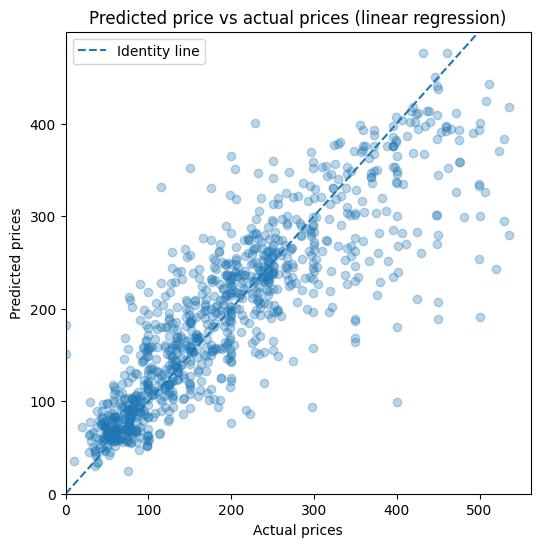

In [2200]:
xgb = XGBRegressor(n_estimators = 50, n_jobs=-1, random_state=10,  ) # gpu_id=0,tree_method='gpu_hist',enable_categorical=True,
xgb.fit(X_train, y_train)

pred = xgb.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

print(f"The r-squared score for the model is {r2_score(y_test, pred):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred)

BEST PARAMS:  {'lambda': 30, 'max_depth': 6, 'n_estimators': 200}
Testing performance
RMSE: 58.30
R2: 0.75
The r-squared score for the model is 0.75 on 985 values.


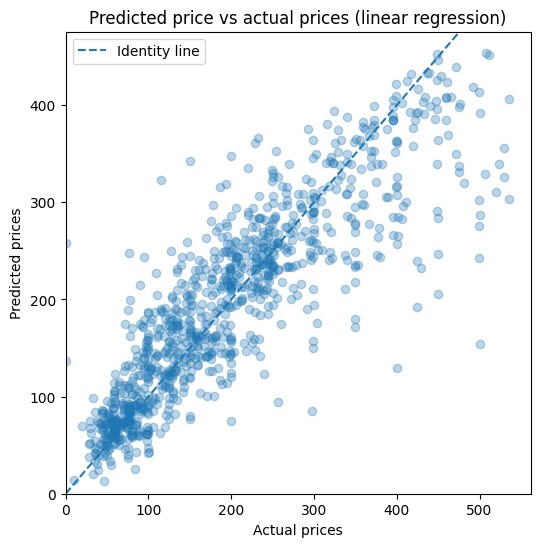

In [2201]:
xgb_optim = GridSearchCV( XGBRegressor(random_state=10) ,  
                            param_grid={
                                        'n_estimators': [50, 60, 100, 200, 500],
                                        'max_depth': [3, 4, 6, 8],
                                        'lambda':[1,10, 15, 30]
                                        }, cv=3, n_jobs=10,
                        )
xgb_optim.fit(X_train, y_train)

print('BEST PARAMS: ', xgb_optim.best_params_)
pred = xgb_optim.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

print(f"The r-squared score for the model is {r2_score(y_test, pred):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred)

make_noise()

C:\Users\lveys\anaconda3\envs\xgboost_py38\lib\site-packages\sklearn\linear_model\_ridge.py:249: LinAlgWarning:

Ill-conditioned matrix (rcond=5.31716e-09): result may not be accurate.



BEST PARAMS:  {'base_estimator__alpha': 10, 'base_estimator__copy_X': True, 'base_estimator__fit_intercept': True, 'base_estimator__max_iter': None, 'base_estimator__normalize': 'deprecated', 'base_estimator__positive': False, 'base_estimator__random_state': None, 'base_estimator__solver': 'auto', 'base_estimator__tol': 0.001, 'base_estimator': Ridge(alpha=10), 'bootstrap': True, 'ccp_alpha': 0.0, 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None}
TEST RMSE:  62.9675
The r-squared score for the model is 0.71 on 985 values.


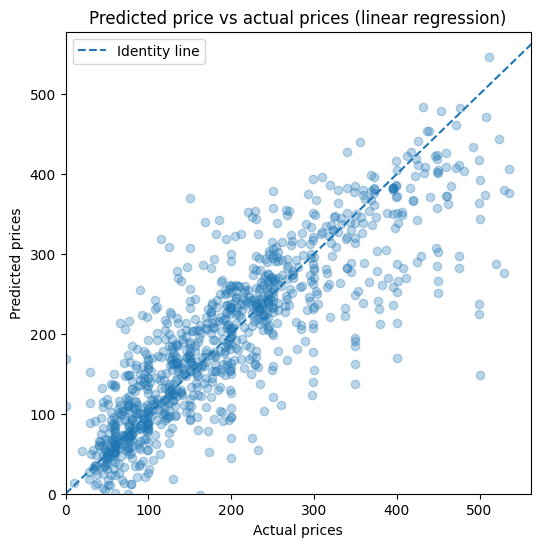

In [2202]:
lf = LinearForestRegressor(base_estimator=Ridge(alpha=10), max_features=1.0)
lf.fit(X_train, y_train)
pred_simple_lin_forest = pd.Series(lf.predict(X_test), index=y_test.index, name='Simple Linear Forest')
score = round(mean_squared_error(y_test, pred_simple_lin_forest, squared=False),4)

print('BEST PARAMS: ', lf.get_params())
print('TEST RMSE: ', score)

print(f"The r-squared score for the model is {r2_score(y_test, pred_simple_lin_forest):.2f} on {len(y_test)} values.")
plot_predictions(y_test,pred_simple_lin_forest)

make_noise()